In [1]:
import numpy as np
from astropy import units as u, constants as const
from matplotlib import pyplot as plt
from scipy.stats import beta
from scipy.special import beta as betafct
from numba import jit, jitclass
from scipy import interpolate
from scipy.interpolate import interp1d
import logging
import sys
import os
sys.path.insert(1, '/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src')
import importlib
import simulation_strategies, collapse, plotting, utils, analtyic_formulas
importlib.reload(simulation_strategies)
importlib.reload(collapse)
importlib.reload(plotting)
importlib.reload(utils)
importlib.reload(analtyic_formulas)
from simulation_strategies import *
from collapse import *
from plotting import *
from utils import *
from analtyic_formulas import *
import cProfile
import pstats
import numdifftools as nd
from findiff import FinDiff
from scipy.interpolate import CubicSpline, splrep, splev

import warnings
warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

t_i = 1
G = 1
rho_H = 1/(6*np.pi*G*t_i**2)
H0 = 2/(3*t_i)
ss = SelfSimilarSolution(t_i, G, rho_H)

def compute_r0_min(r_min, r_max, N):
    """
    Compute r0_min such that the spacing dR in np.linspace(r0_min, r_max, N)
    satisfies dR = r0_min - r_min. That is, the inner edge of the innermost shell is at r_min.
    
    Parameters:
    - r_min (float): The minimum radius.
    - r_max (float): The maximum radius.
    - N (int): Number of points.
    
    Returns:
    - float: The computed r0_min.
    """
    return (r_max + r_min * (N - 1)) / N

def make_cycloid_config(r_min=1e-2, r_max=1, N=1, t_max=5000, dt_min=1e-9, rho_bar=rho_H, delta_i=1, stepper_strategy='velocity_verlet', timescale_strategy='dyn', save_strategy='vflip', safety_factor=1e-4, reflect_bool=False, save_dt=1e-2, j_coeff=0, softlen=0, thickness_coef=0, irs='r0min_start_equal', mes='overlap_inclusive', pressure_strategy='zero', polytropic_index=-1, polytropic_coef=0, accel_strategy='soft_all', r_th=None, no_pm=False, density_strategy='background_plus_tophat2', relaxation_time=0, energy_strategy='kin_grav_rot', H=H0, drhodr_strategy='finite_diff', cq=0, hbar2_over_m2=0, fn=None, timestep_strategy='simple_adaptive', dt=0):
    if r_th is None:
        r_th = r_max
    m_pert = rho_bar * delta_i * 4/3 * np.pi * min(r_max, r_th)**3
    if no_pm:
        point_mass = 0
        shell_volume_strategy = 'keep_edges'
    else:
        point_mass = 4/3 * np.pi * r_min**3 * rho_bar * (1+delta_i)
        shell_volume_strategy = 'inner_not_zero'

    r0_min = compute_r0_min(r_min=r_min, r_max=r_max, N=N)
    r_min_strategy = 'reflect' if reflect_bool else 'absorb'
    # if energy_strategy == 'gas':
    #     t_ta_strategy = 't_ta_gas'
    #     r_ta_strategy = 'r_ta_gas'
    # else:
    t_ta_strategy = 't_ta_cycloid'
    r_ta_strategy = 'r_ta_cycloid'
    if j_coeff > 0:
        ang_mom_strategy = 'const'
        ang_mom_strategy = 'gmr'
    else:
        ang_mom_strategy = 'zero'
    return {
        'point_mass': point_mass,
        'initial_radius_strategy': irs,
        'density_strategy': density_strategy,
        'delta': delta_i,
        'tophat_radius': r_th,
        'r0_min': r0_min,
        'rho_bar': rho_H,
        't_max': t_max,
        'dt_min': dt_min,
        'N': N,
        'r_min': r_min,
        'r_min_strategy': r_min_strategy,
        'H': H,
        'r_max': r_max,
        'm_pert': m_pert, 
        'stepper_strategy': stepper_strategy,
        'timescale_strategy': timescale_strategy,
        'save_strategy': save_strategy,
        'safety_factor': safety_factor,
        'save_dt': save_dt,
        'j_coef': j_coeff,
        'ang_mom_strategy': ang_mom_strategy,
        'r_ta_strategy': r_ta_strategy,
        't_ta_strategy': t_ta_strategy,
        'save_strategy': 'vflip',
        'softlen': softlen,
        'thickness_coef': thickness_coef,
        'm_enc_strategy': mes,
        'pressure_strategy': pressure_strategy,
        'polytropic_index': polytropic_index,
        'polytropic_coef': polytropic_coef,
        'accel_strategy': accel_strategy,
        'shell_volume_strategy': shell_volume_strategy,
        'relaxation_time': relaxation_time,
        'energy_strategy': energy_strategy,
        'drhodr_strategy': drhodr_strategy,
        'viscosity_cq': cq,
        'hbar2_over_m2': hbar2_over_m2,
        'save_filename': fn,
        'timestep_strategy': timestep_strategy,
        'dt': dt,
    }

def run_and_plot(config, profile=False):
    sc = SphericalCollapse(config)
    if profile:
        # Profile the run method
        profiler = cProfile.Profile()
        profiler.enable()
        results = sc.run()
        profiler.disable()

        # Print the profiling results
        stats = pstats.Stats(profiler).sort_stats('cumulative')
        stats.print_stats(50)  # Print top 50 time-consuming functions
    else:
        results = sc.run() 
    plotter = SimulationPlotter(results, sc)
    # Configuration 1: Radius analysis
    plotter.plot_radius_analysis()
    # Configuration 2: Velocity and acceleration analysis
    plotter.plot_velocity_acceleration()
    # Configuration 3: Mass, density, and timescales
    plotter.plot_mass_density_timescales()
    # Configuration 4: Energy analysis
    plotter.plot_energy_analysis()
    # Configuration 5: Pressure analysis
    plotter.plot_pressure_analysis()
    return sc, results, plotter

def just_plot(plotter, t_center=None, window=None):
    if (t_center is None) or (window is None):
        plotter.plot_radius_analysis()
        plotter.plot_velocity_acceleration()
        plotter.plot_mass_density_timescales()
        plotter.plot_energy_analysis()
    else:
        t_min = t_center - window
        t_max = t_center + window

        # Add time window to all plots using a custom shell configuration
        shell_config = PlotConfig(
            property_name='',
            xlim=(t_min, t_max)
        )
        plotter.plot_radius_analysis(shell_config=shell_config)
        plotter.plot_velocity_acceleration(shell_config=shell_config)
        plotter.plot_mass_density_timescales(shell_config=shell_config)
        plotter.plot_energy_analysis(shell_config=shell_config)
        plotter.plot_pressure_analysis(shell_config=shell_config)


ModuleNotFoundError: No module named 'src'

In [2]:
# Default plotting settings
def my_mpl():
    plt.rc('font', family='serif', size=20)
    plt.rc('axes', grid=True)
    plt.rc('lines', lw=3)
    ts = 8
    plt.rc('xtick.minor', size=ts-2)
    plt.rc('ytick.minor', size=ts-2)
    plt.rc('xtick.major', size=ts)
    plt.rc('ytick.major', size=ts)
    plt.rc('figure', figsize=[9, 5])
my_mpl()
logging.basicConfig(level=logging.DEBUG,
                    format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [ ]:
t_max = 1000
N = 2
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_kdk', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive',)#timestep_strategy='const_but_calculate', dt=1e-1)

In [ ]:
s, r, c = run_and_plot(config_gauss)

In [ ]:
t_max = 1000
N = 2
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='beeman', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive',)#timestep_strategy='const_but_calculate', dt=1e-1)

In [ ]:
s, r, c = run_and_plot(config_gauss)

In [ ]:
t_max = 1000
N = 2
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_cross', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive',timestep_strategy='const_but_calculate', dt=1e-1)

In [ ]:
s, r, c = run_and_plot(config_gauss)

In [22]:
t_max = 172
N = 2
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_cross_vel', dt_min=1e-16, safety_factor=1e-4, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive', timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-28 22:42:39,772 - collapse - INFO - Simulation setup complete


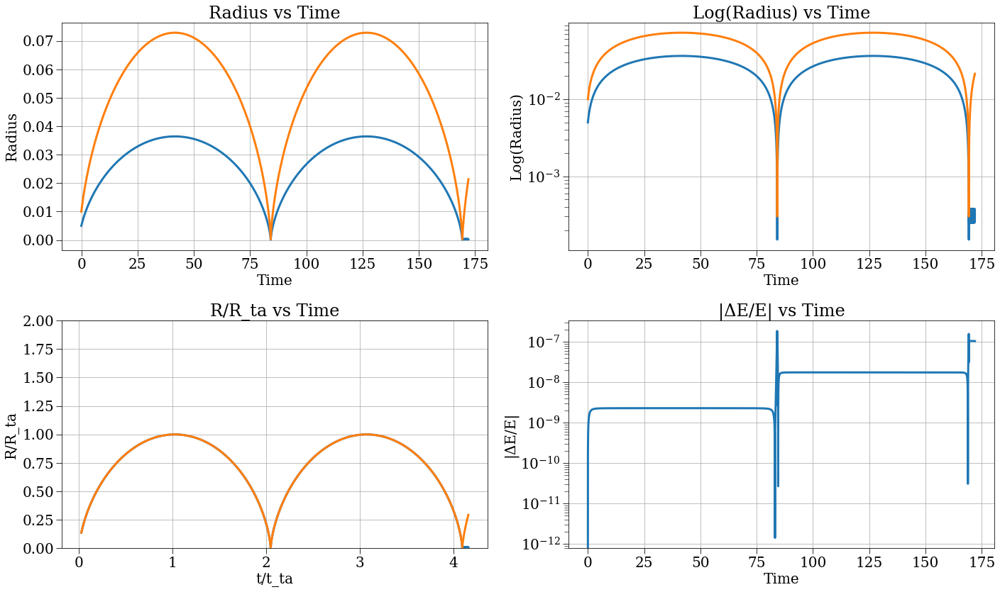

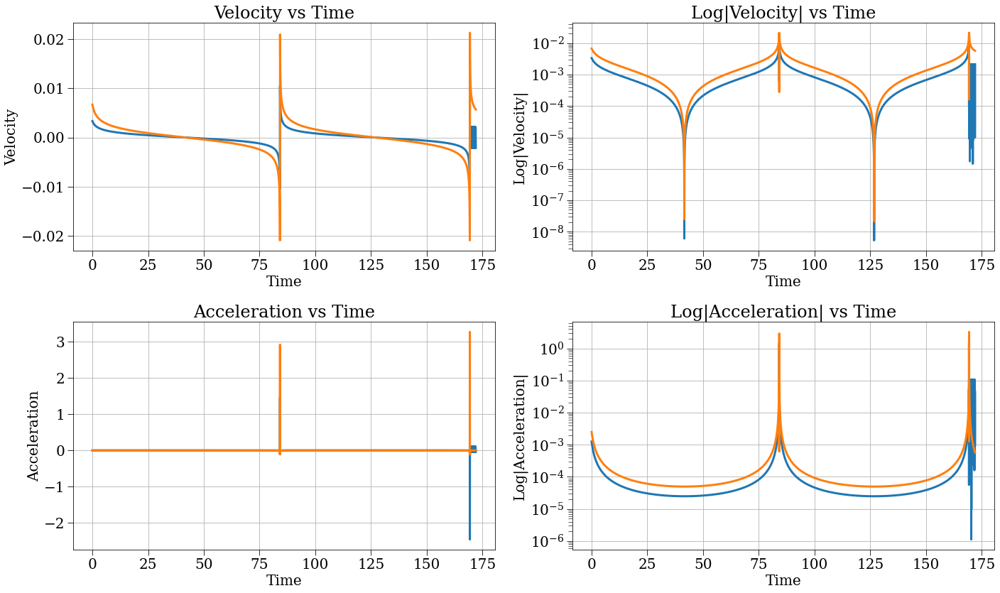

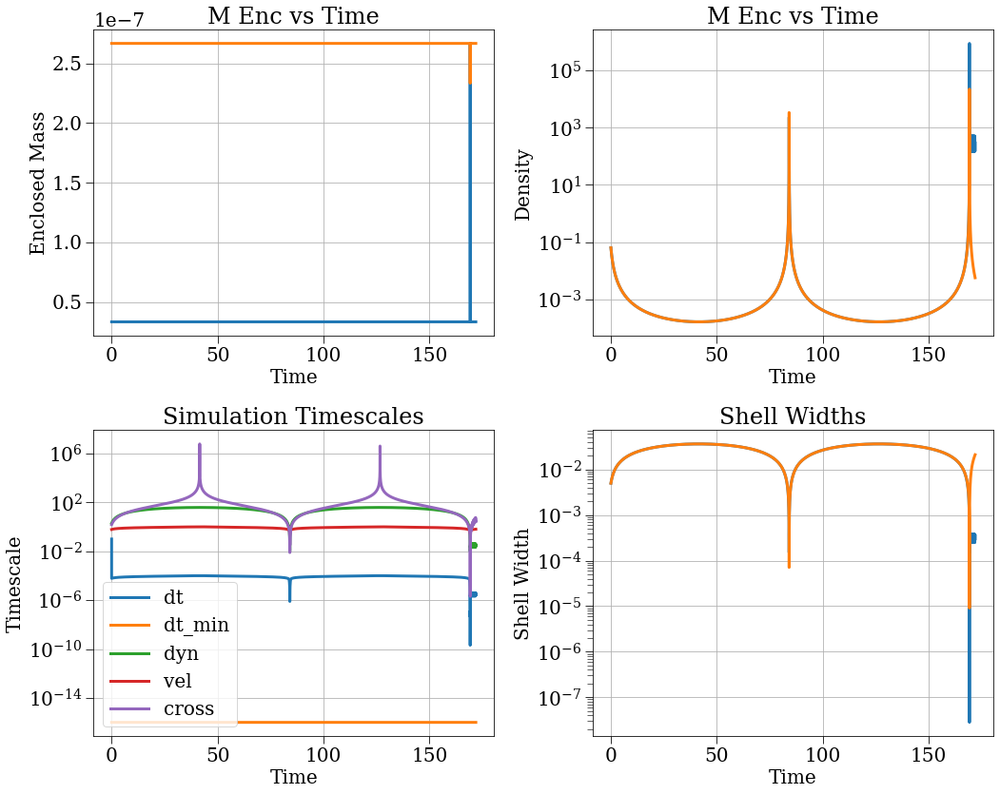

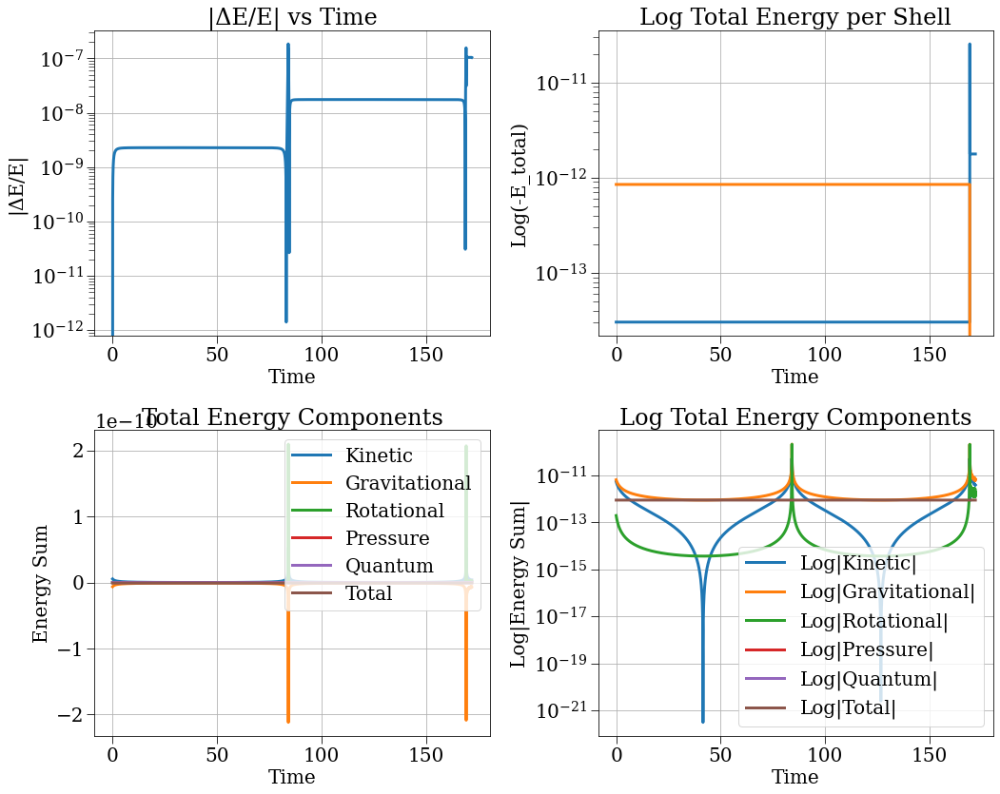

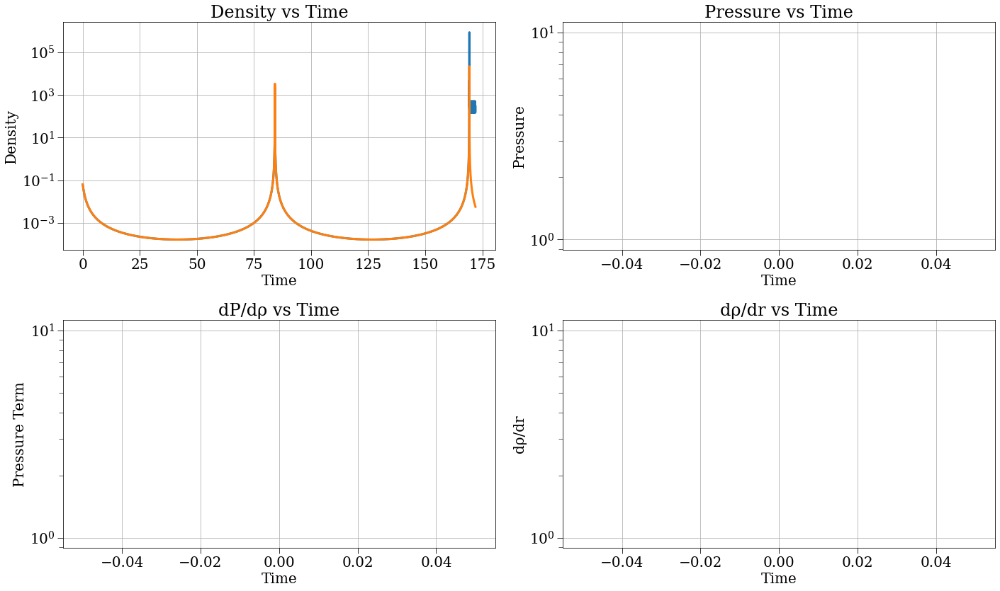

In [23]:
s, r, c = run_and_plot(config_gauss)

In [19]:
t_max = 400
N = 2
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-3, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive',timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-28 21:10:57,101 - collapse - INFO - Simulation setup complete


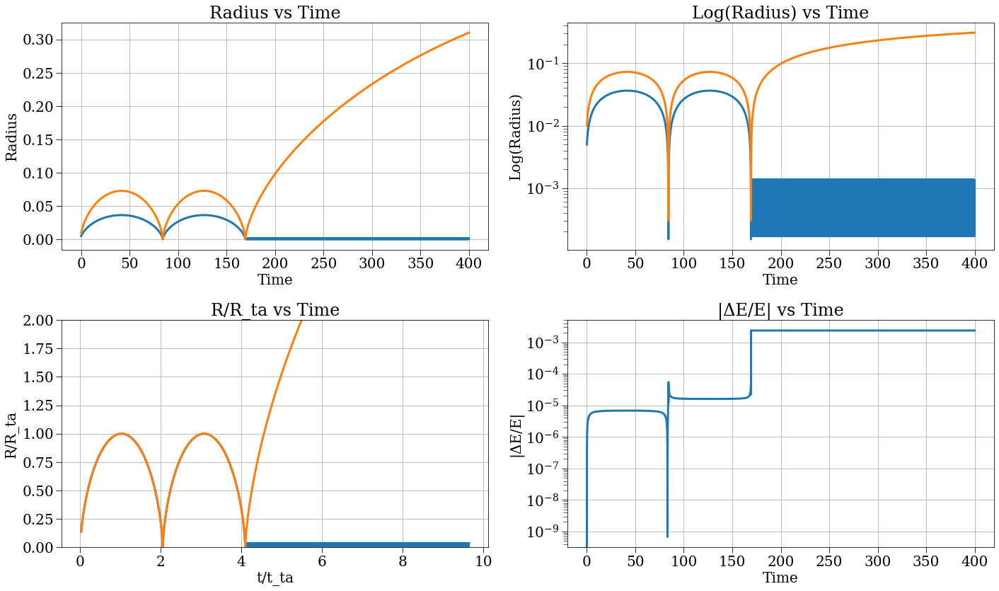

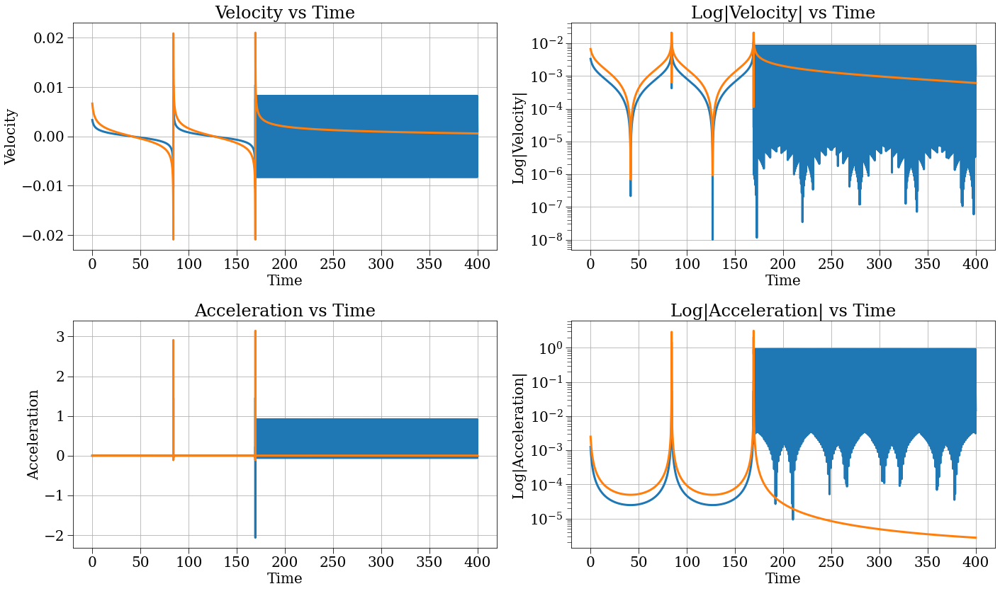

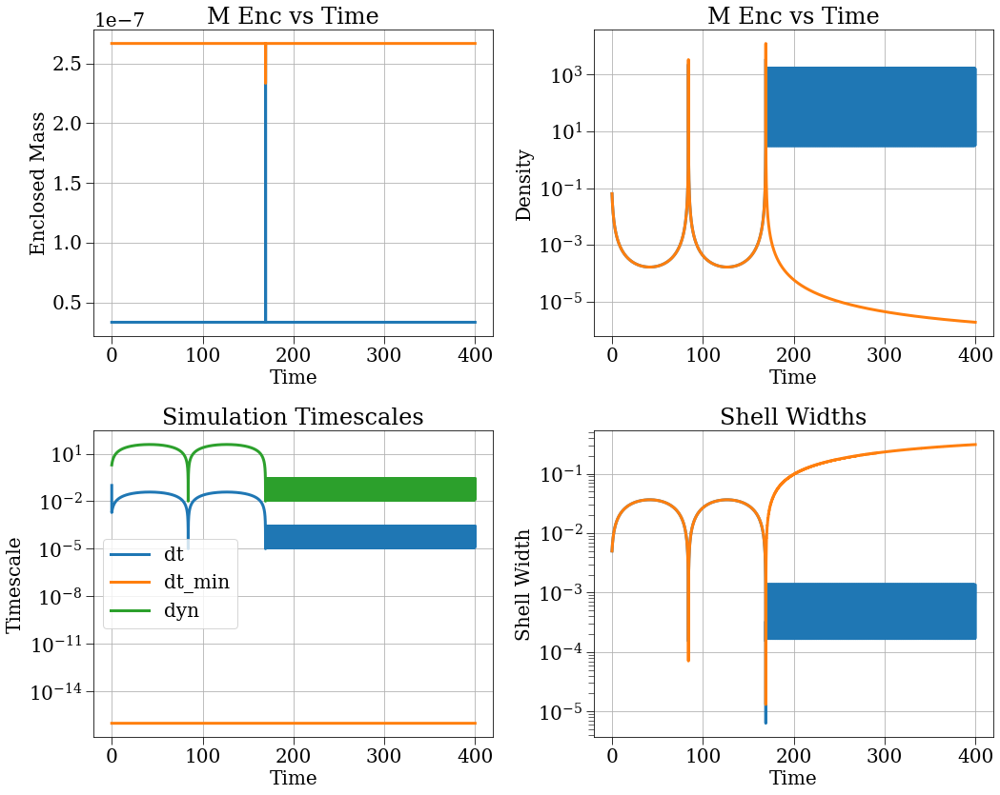

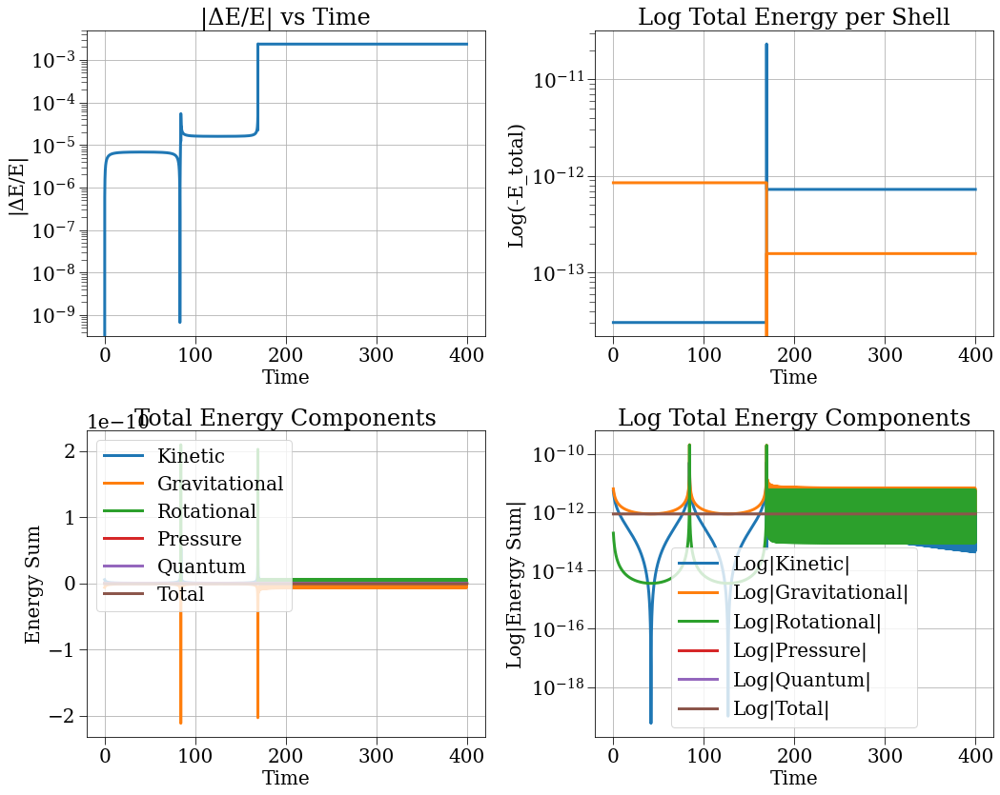

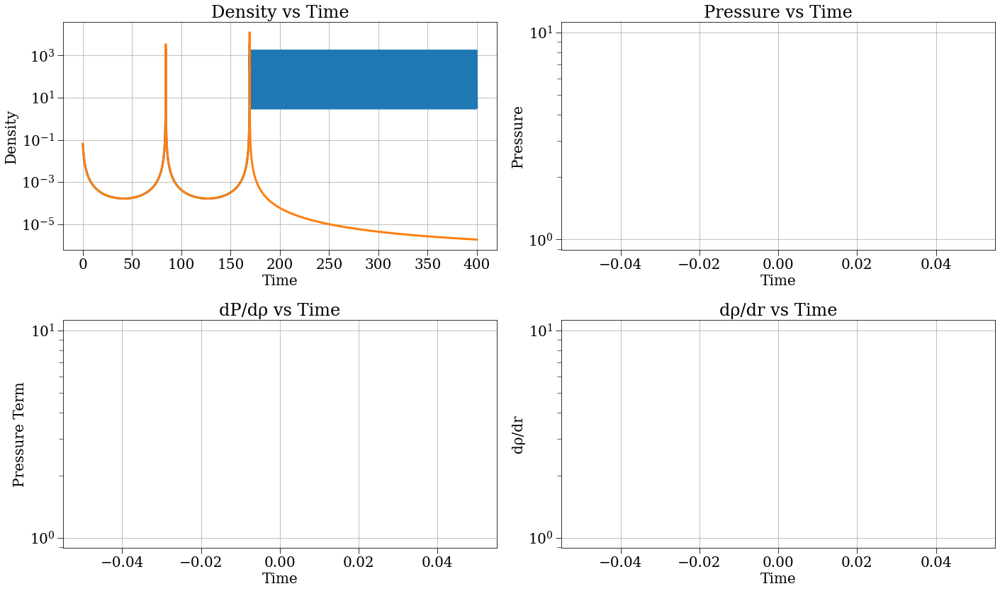

In [20]:
s, r, c = run_and_plot(config_gauss)

In [12]:
t_max = 1000
N = 2
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive',timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-28 20:28:27,006 - collapse - INFO - Simulation setup complete


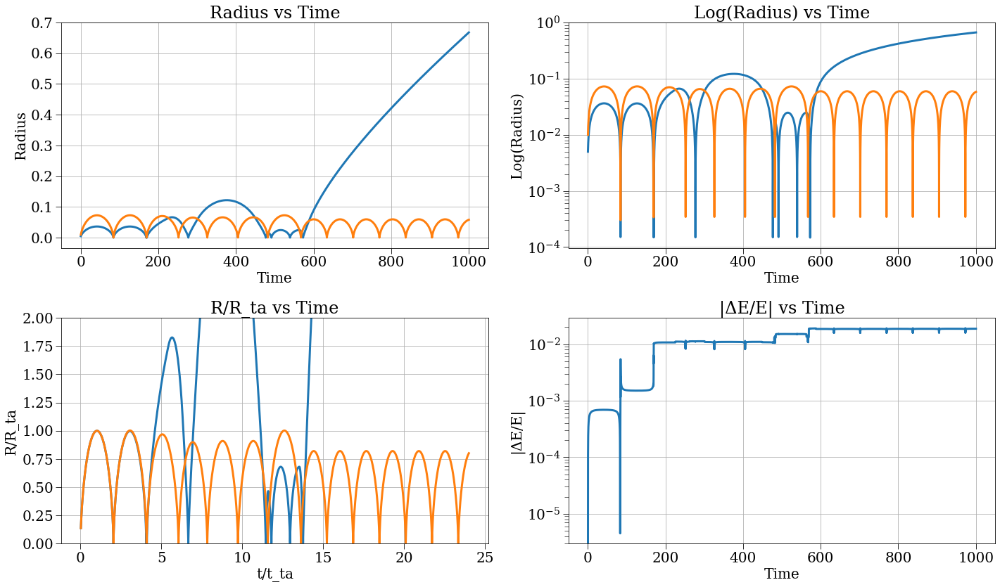

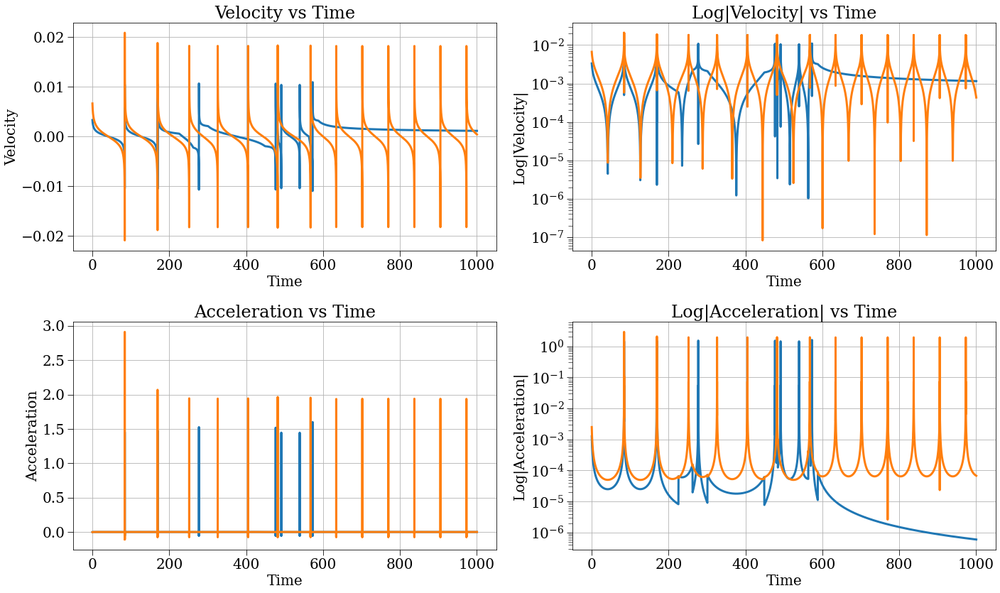

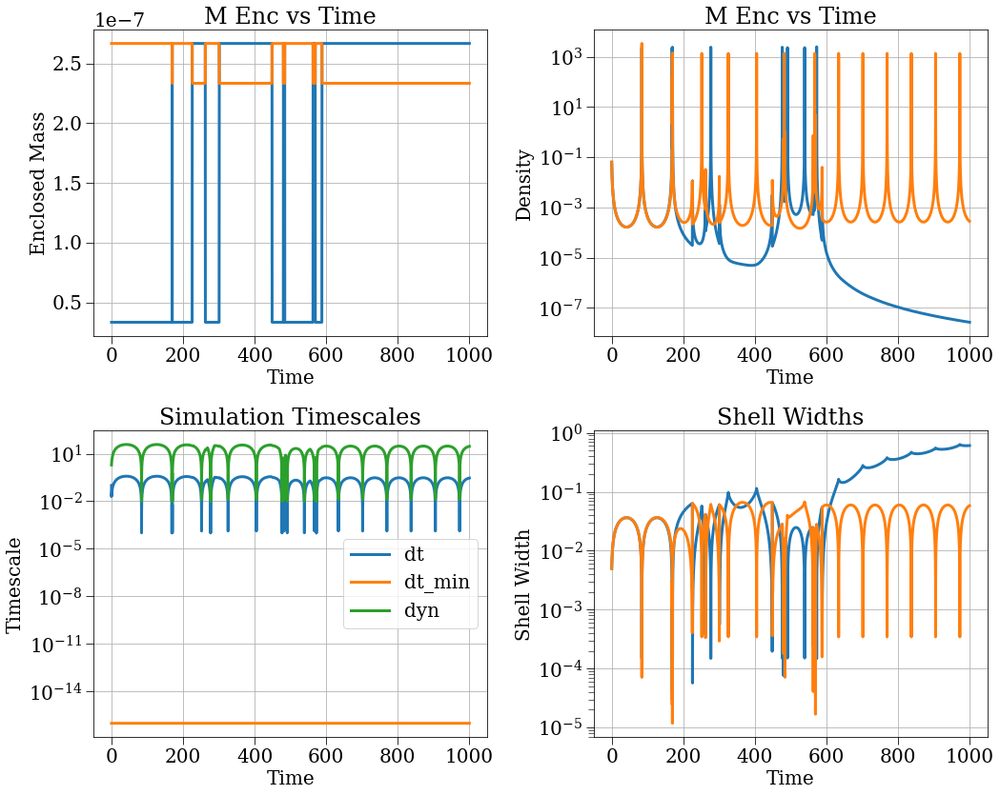

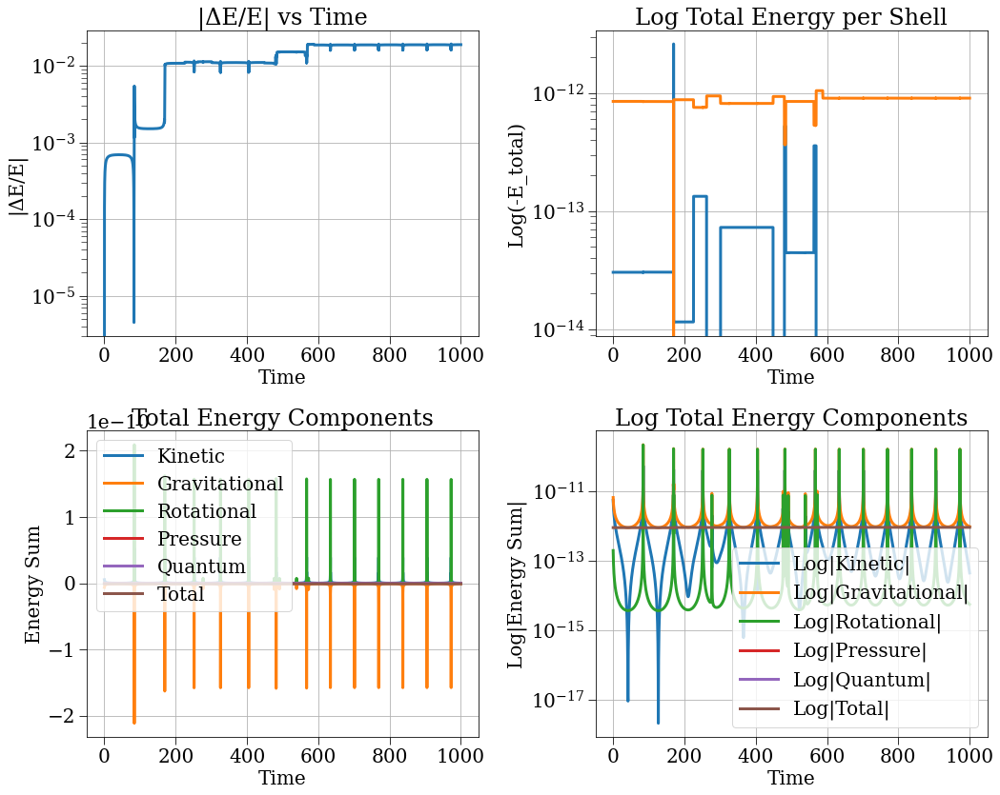

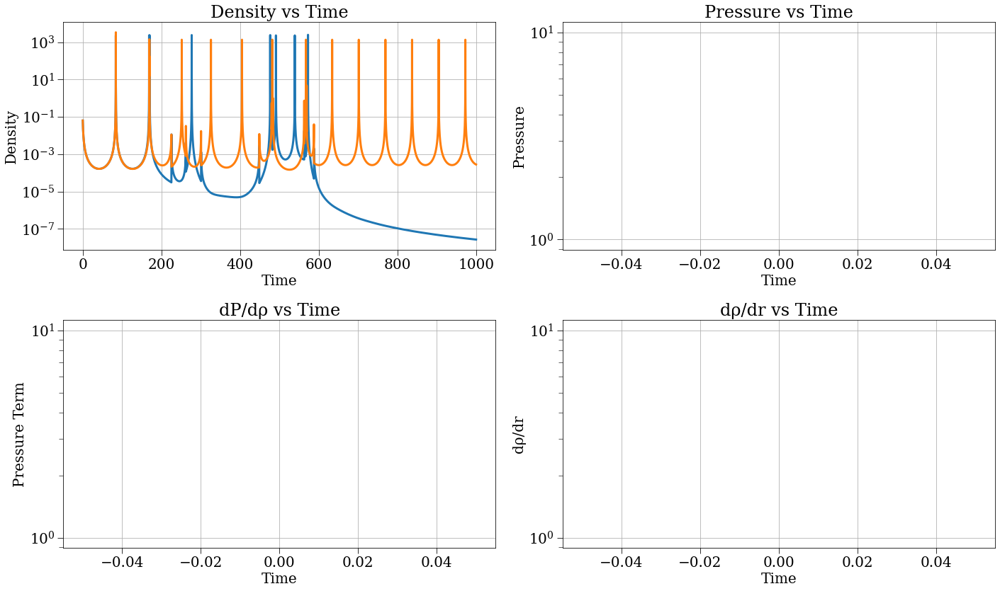

In [13]:
s, r, c = run_and_plot(config_gauss)

Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

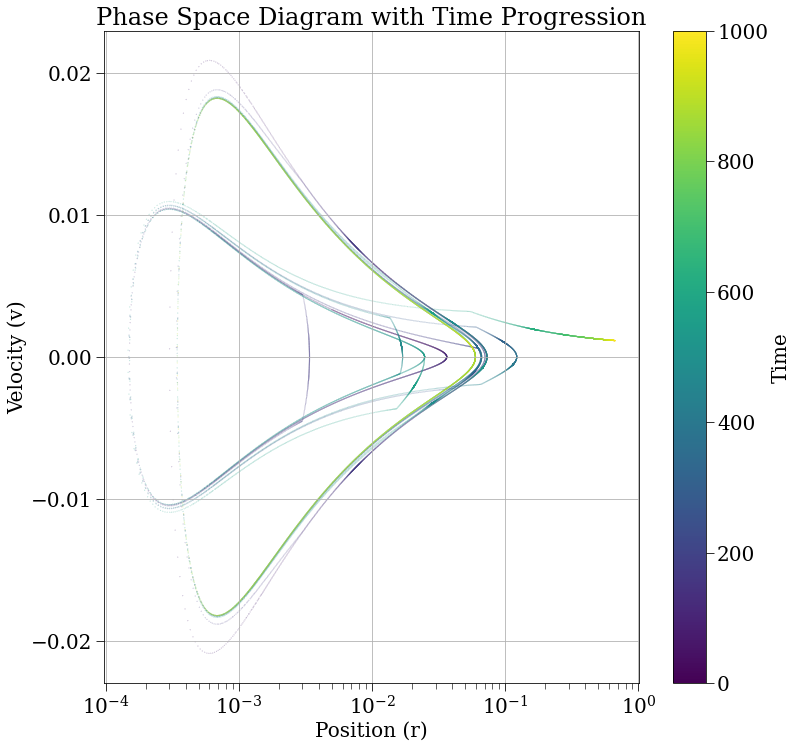

In [14]:
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(12, 12))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
for i in range(N):
    rvals = r['r'][:,i]
    vvals = r['v'][:,i]
    skip = 1
    sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.01, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


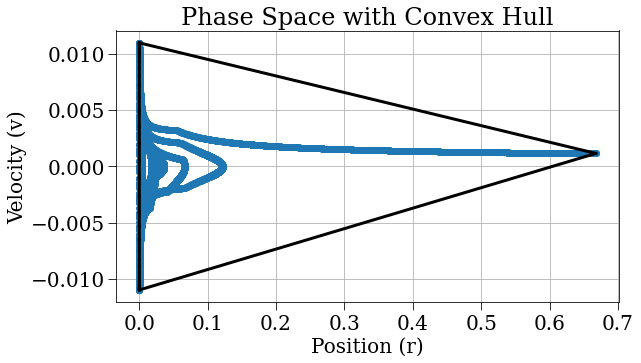

Phase space area: 0.007319099092522946


In [16]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

# Example data: replace with your rvals and vvals
rvals = r['r'][:,0]
vvals = r['v'][:,0]

# Combine r and v into a single array of points
points = np.vstack((rvals, vvals)).T

# Compute the convex hull
hull = ConvexHull(points)

# Plot the points and the convex hull
plt.plot(points[:, 0], points[:, 1], 'o')
for simplex in hull.simplices:
    plt.plot(points[simplex, 0], points[simplex, 1], 'k-')

plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space with Convex Hull')
plt.show()

# Area of the convex hull
area = hull.volume
print(f"Phase space area: {area}")

In [3]:
t_max = 100_000
config_gauss = make_cycloid_config(N=1, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-29 11:24:18,700 - collapse - INFO - Simulation setup complete


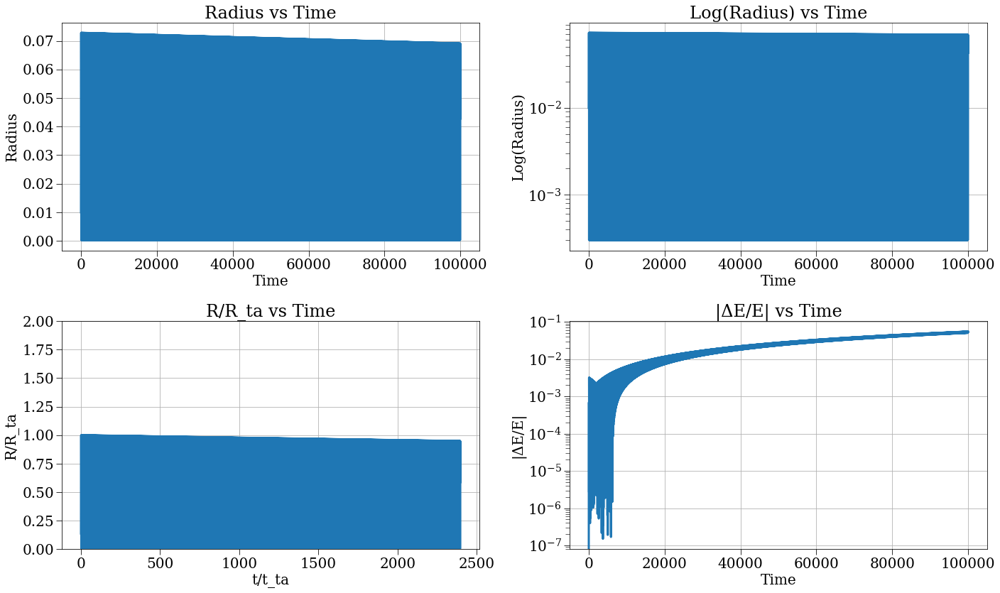

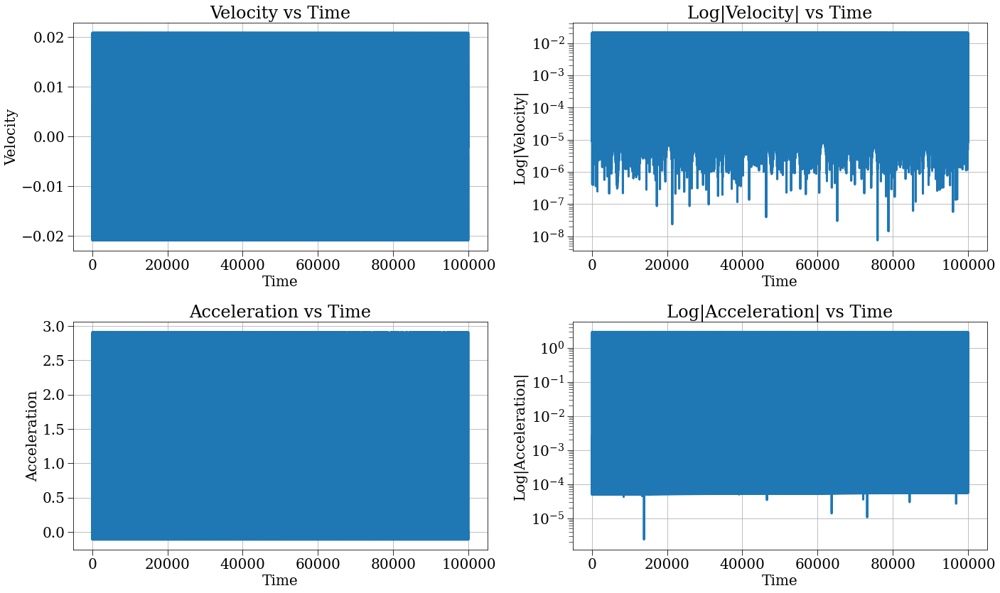

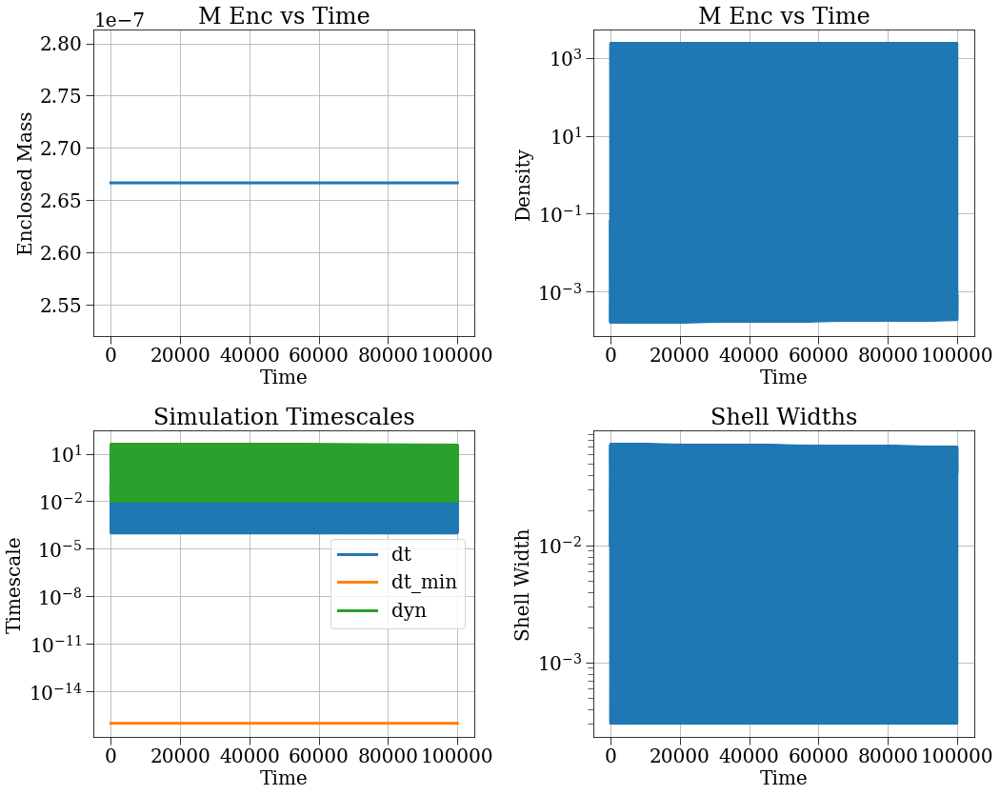

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:666: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


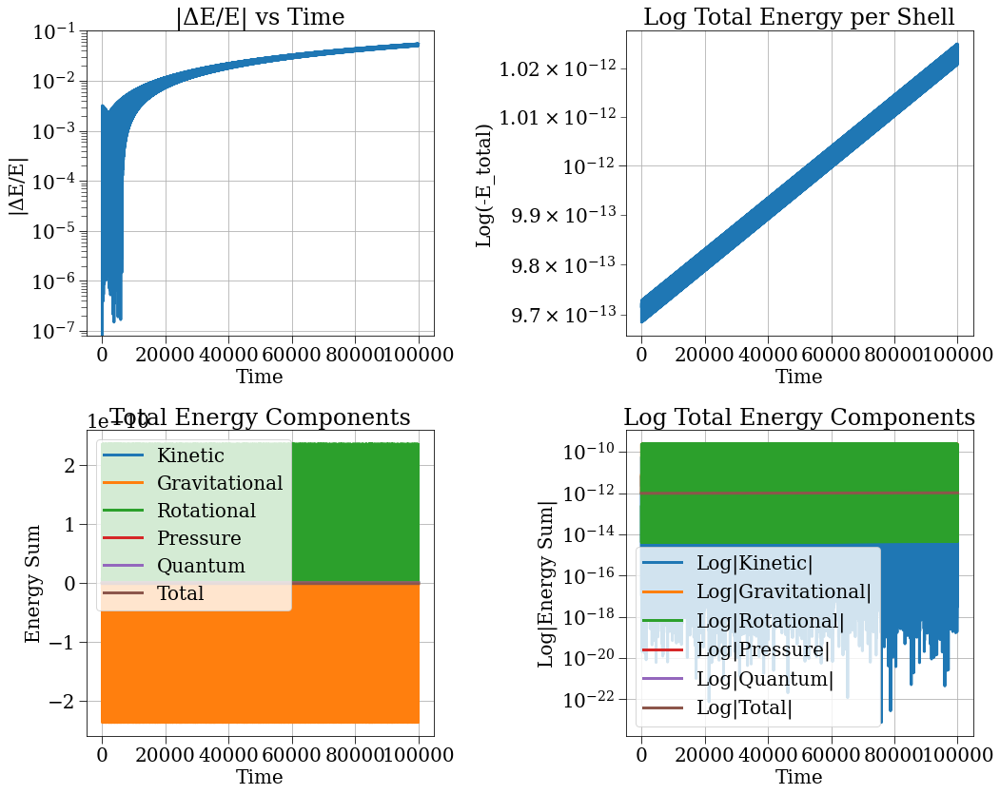

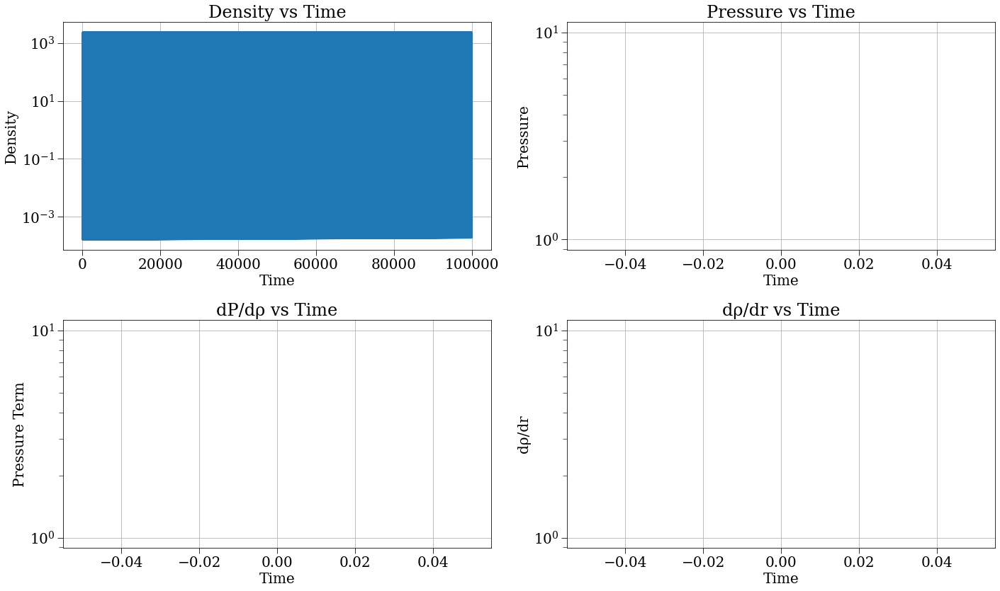

In [4]:
s, r, c = run_and_plot(config_gauss)

In [145]:
t_max = 100_000
config_gauss = make_cycloid_config(N=1, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=5e-3, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-29 03:15:15,168 - collapse - INFO - Simulation setup complete


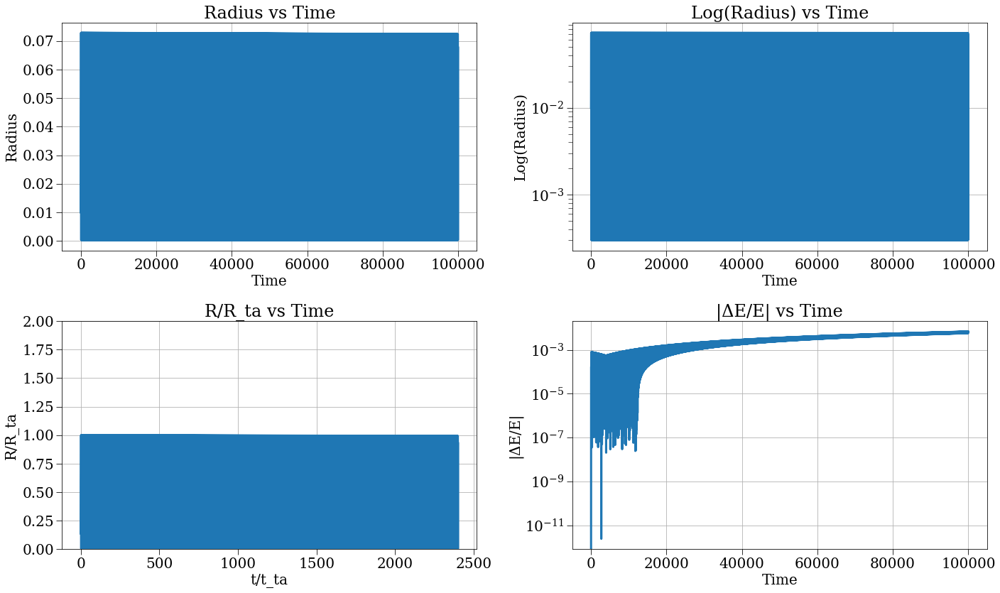

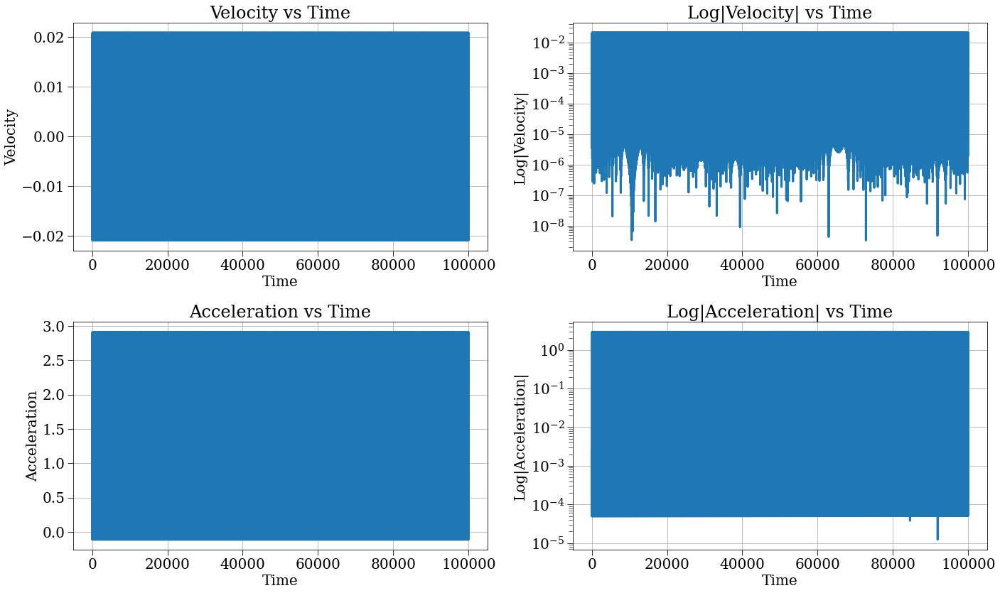

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:566: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


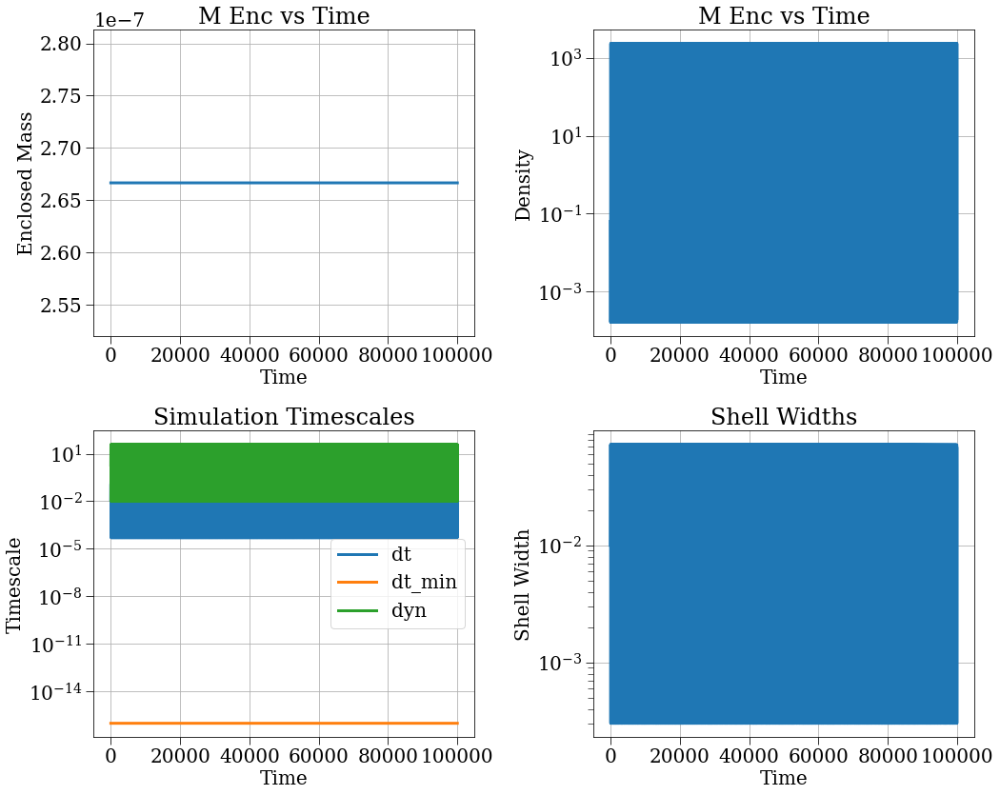

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:666: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


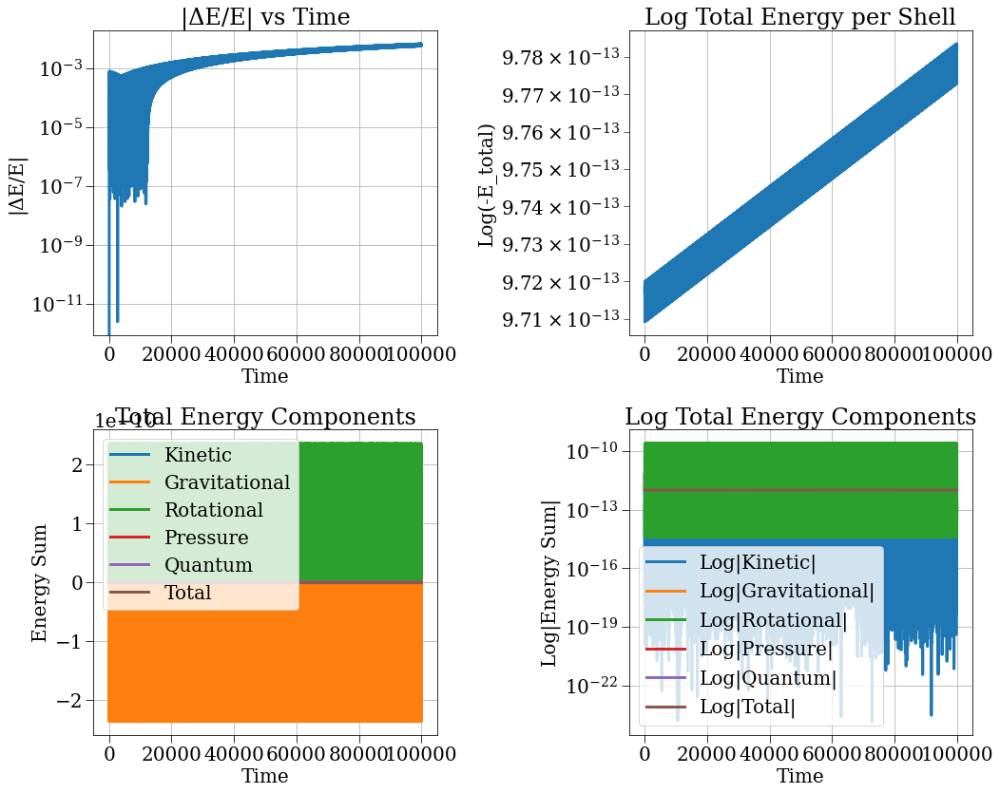

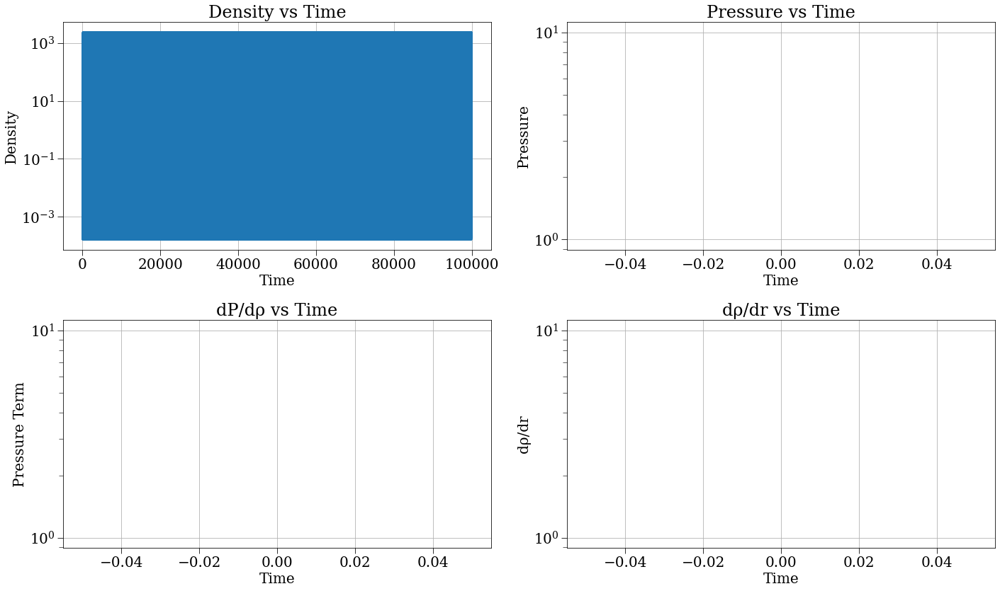

In [146]:
s, r, c = run_and_plot(config_gauss)

Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

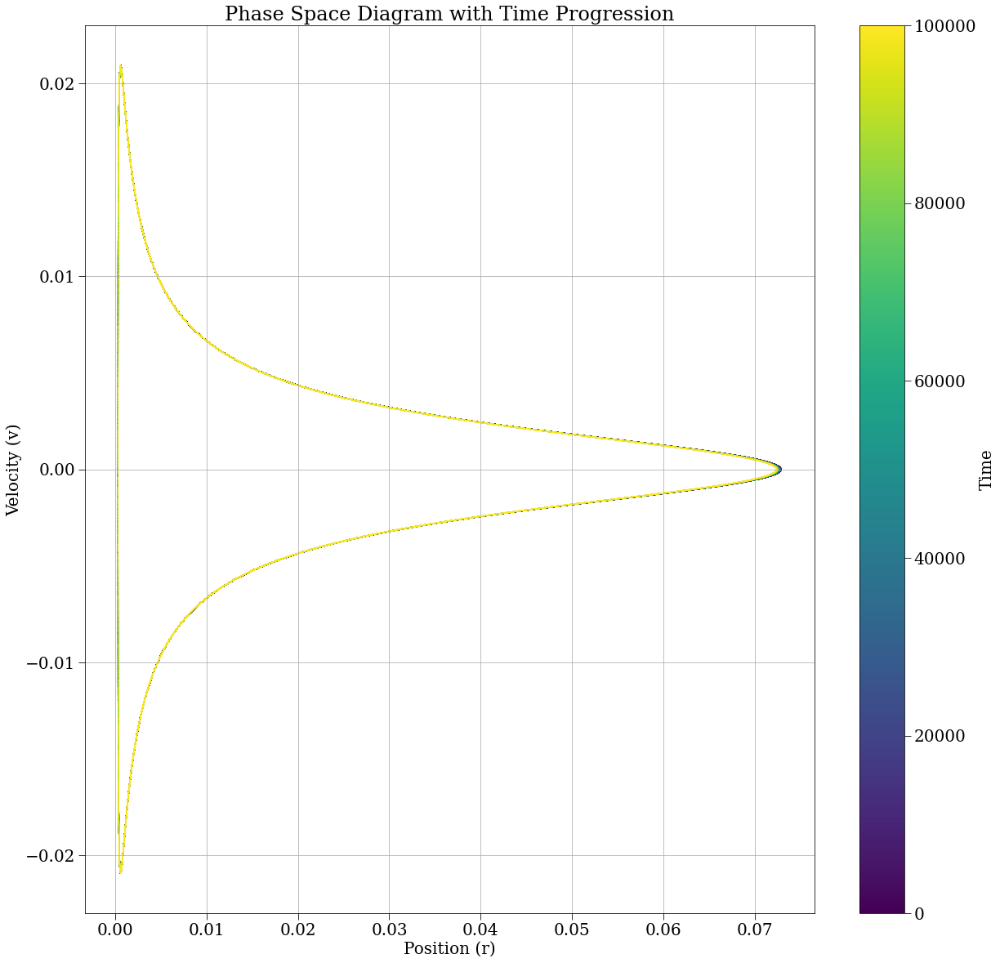

In [147]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
#plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


In [141]:
t_max = 100_000
config_gauss = make_cycloid_config(N=1, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-29 02:45:02,967 - collapse - INFO - Simulation setup complete


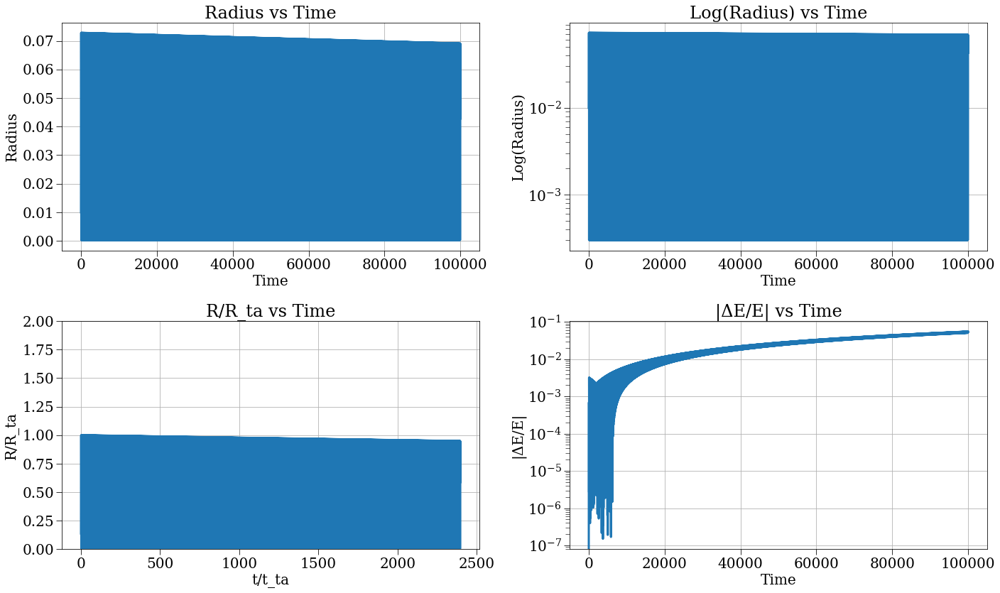

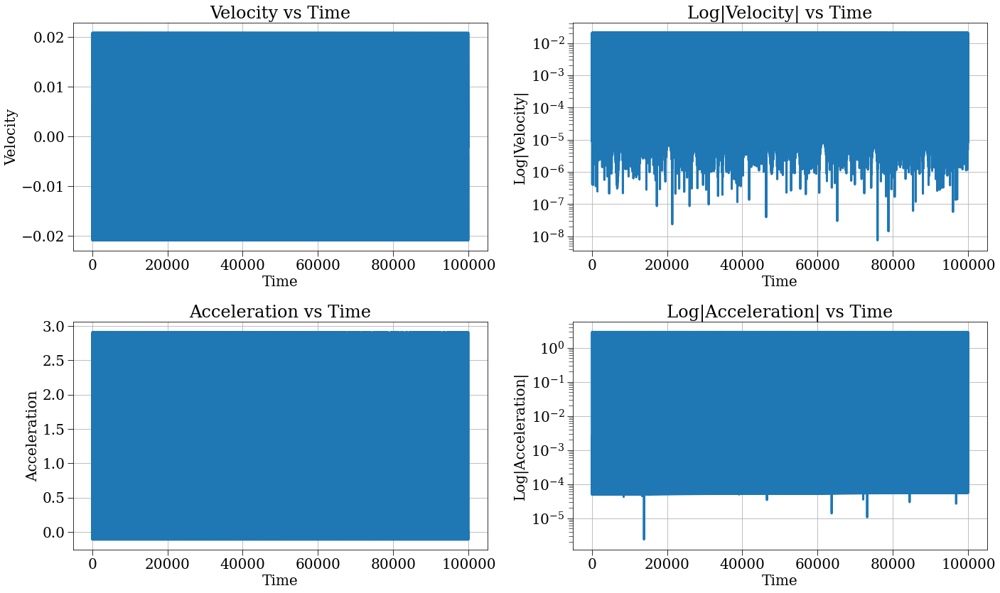

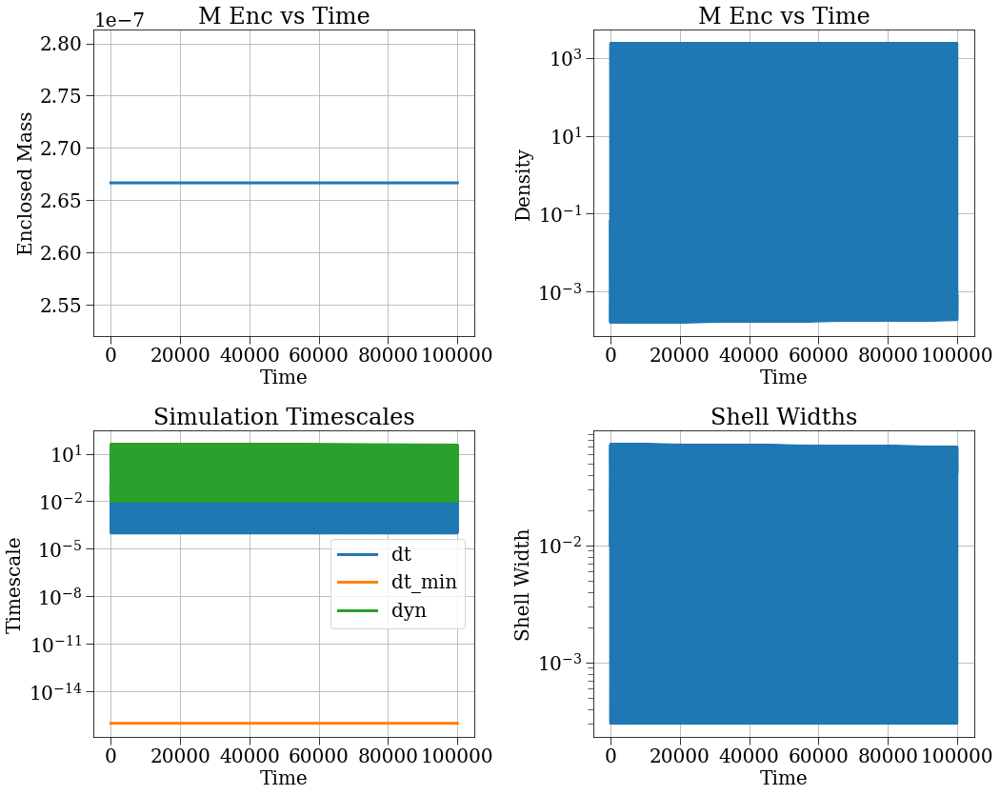

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:666: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


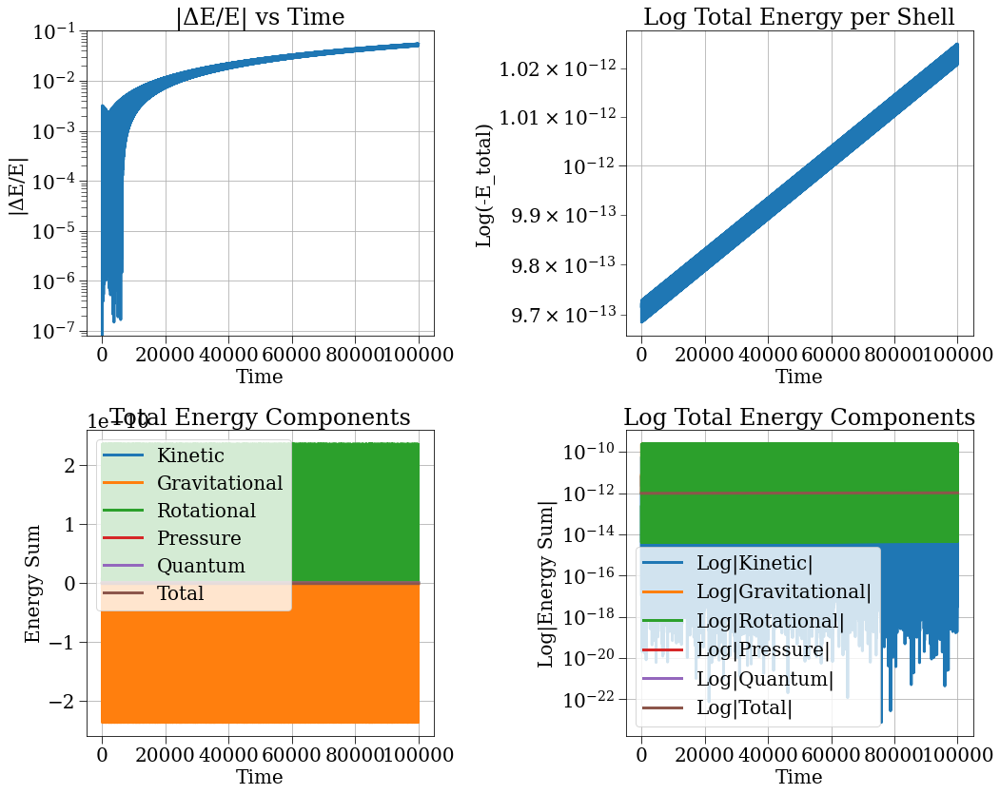

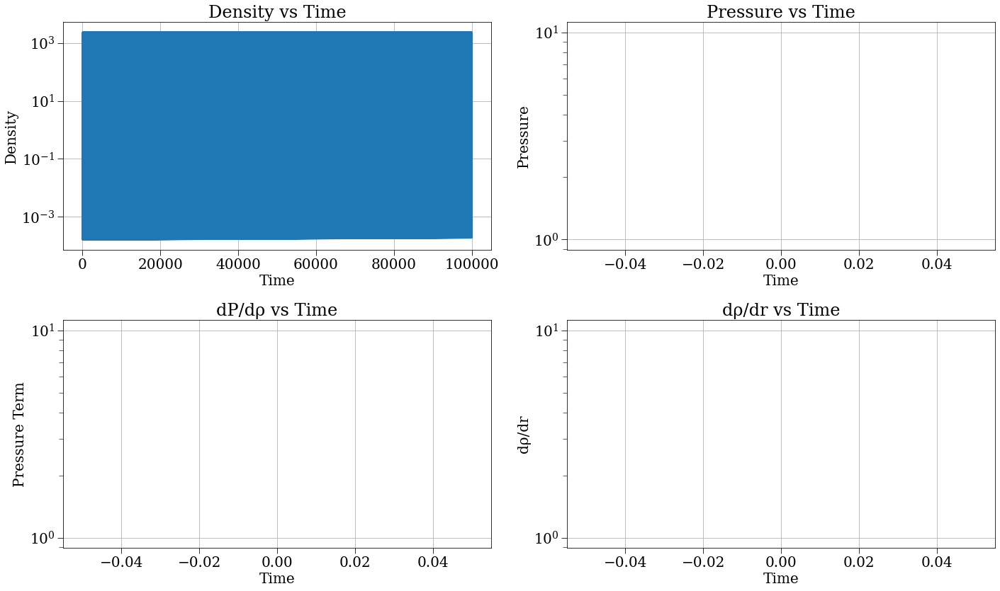

In [142]:
s, r, c = run_and_plot(config_gauss)

Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

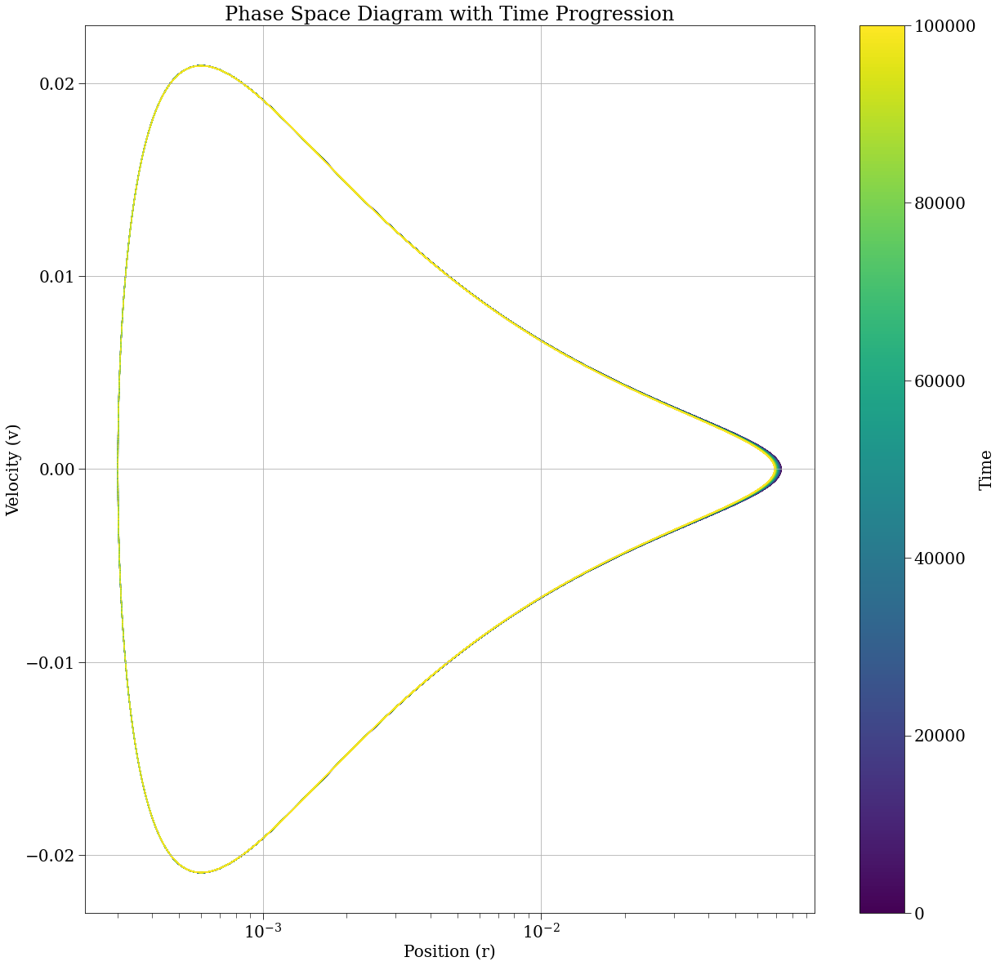

In [143]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

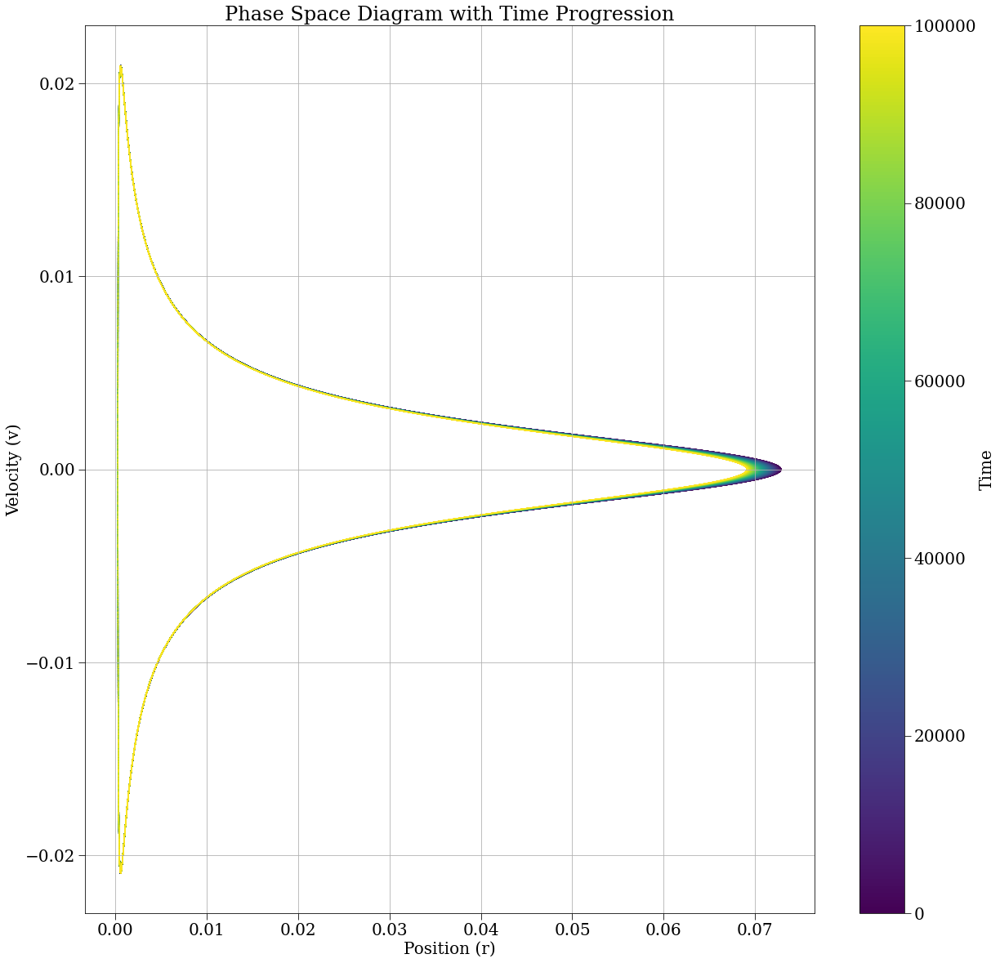

In [144]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
#plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


In [5]:
t_max = 100_000
config_gauss = make_cycloid_config(N=1, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_kdk', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', )#timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-29 04:07:52,872 - collapse - INFO - Simulation setup complete


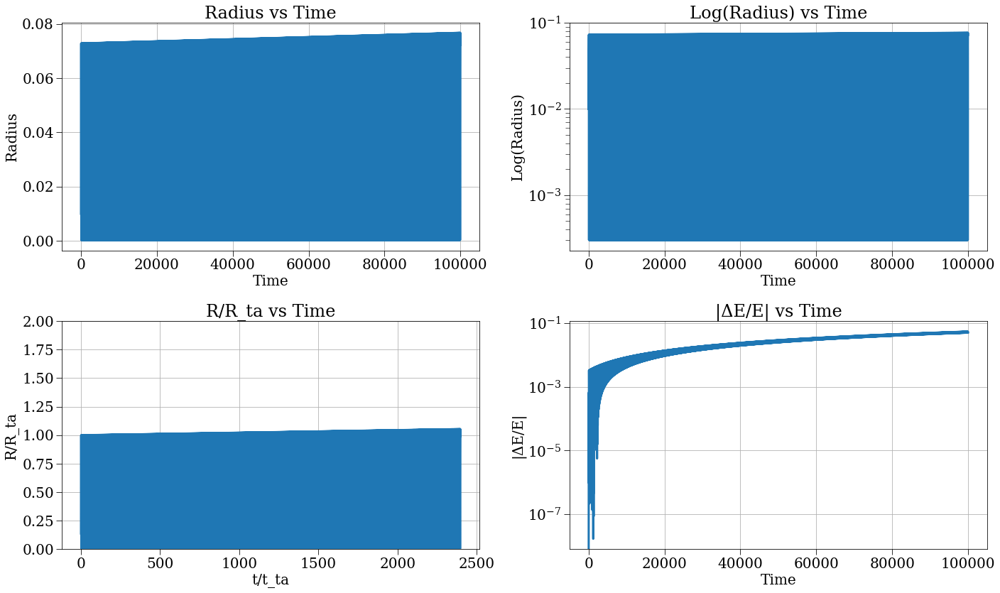

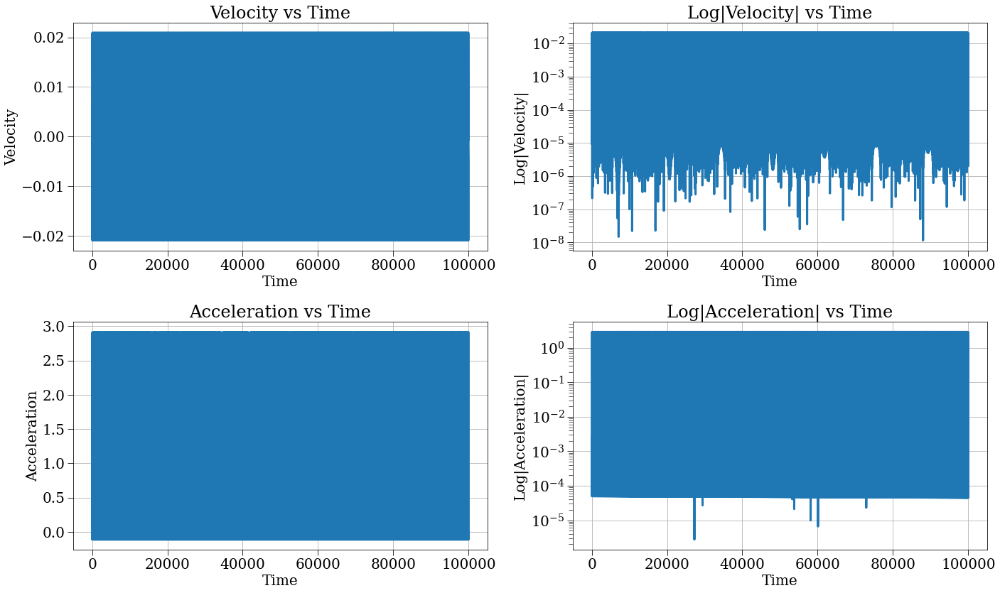

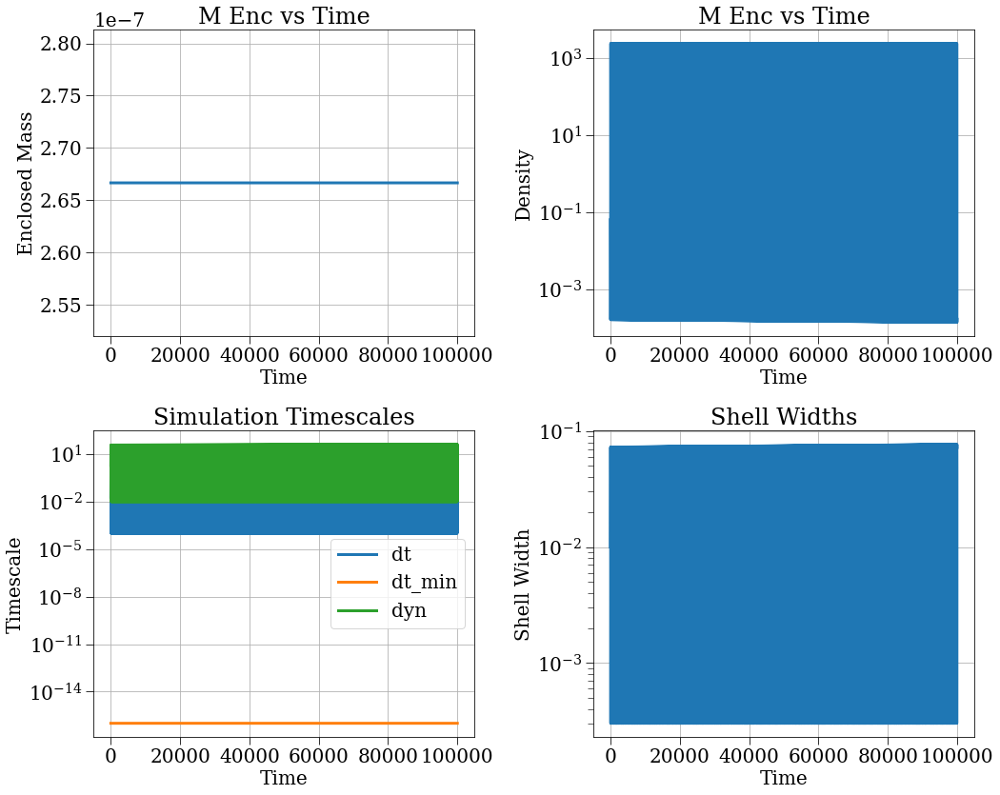

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:666: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


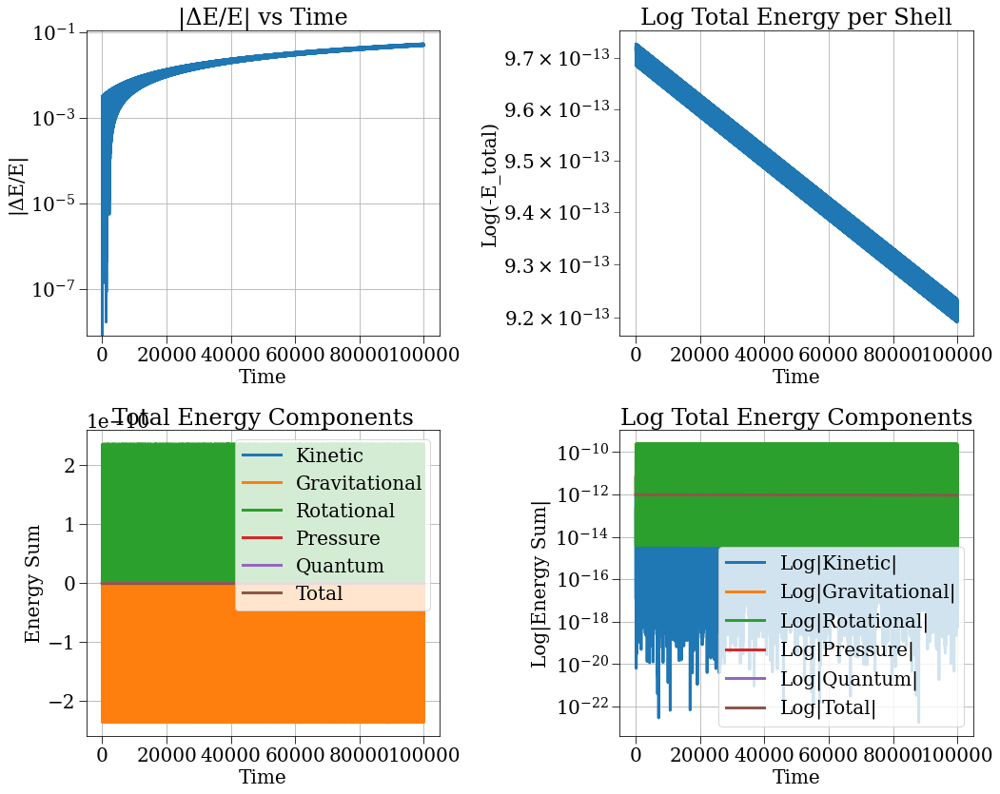

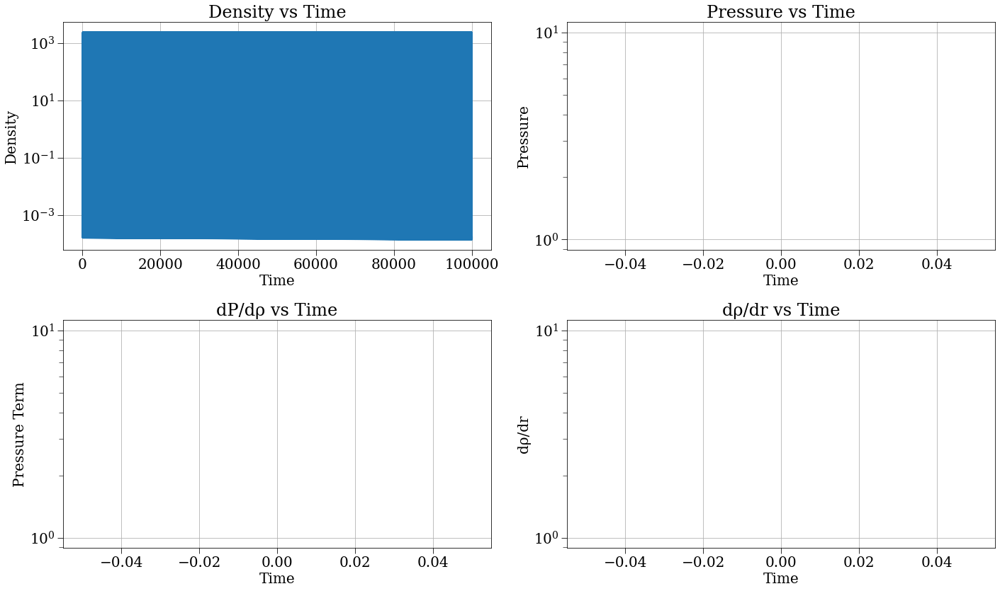

In [6]:
s, r, c = run_and_plot(config_gauss)

Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

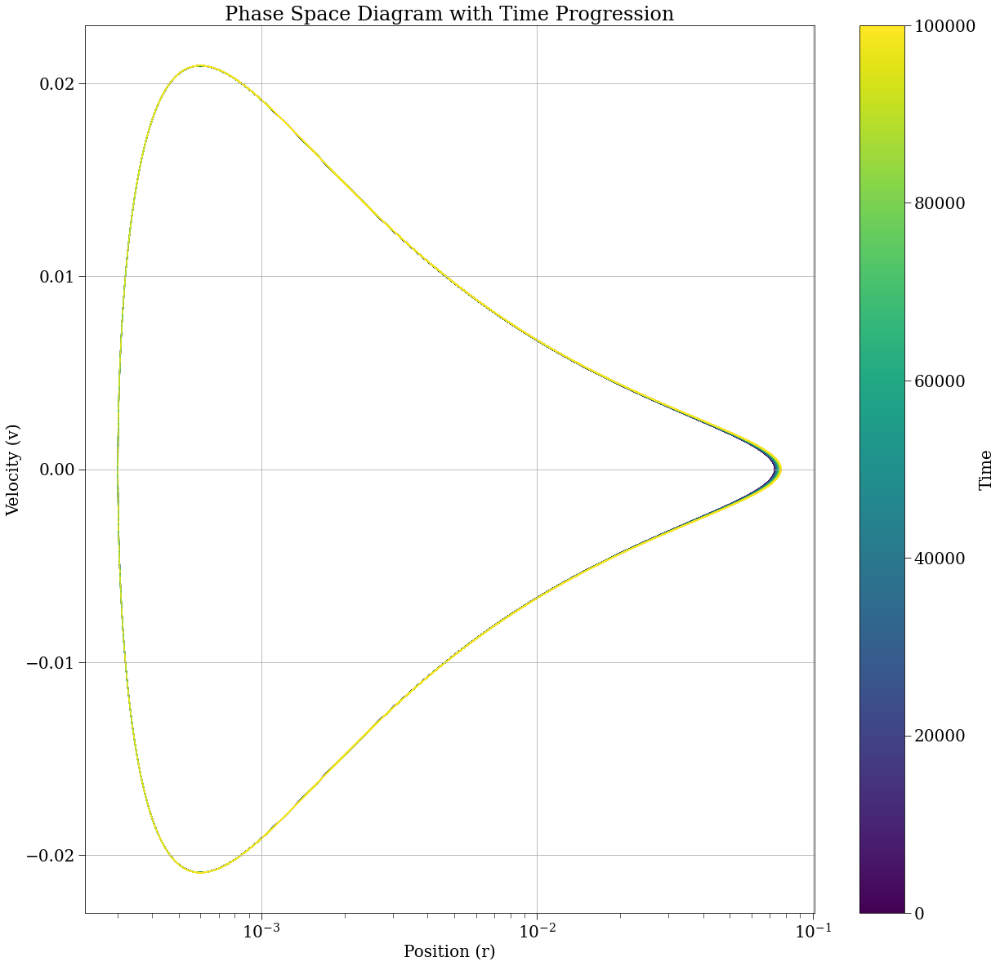

In [140]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

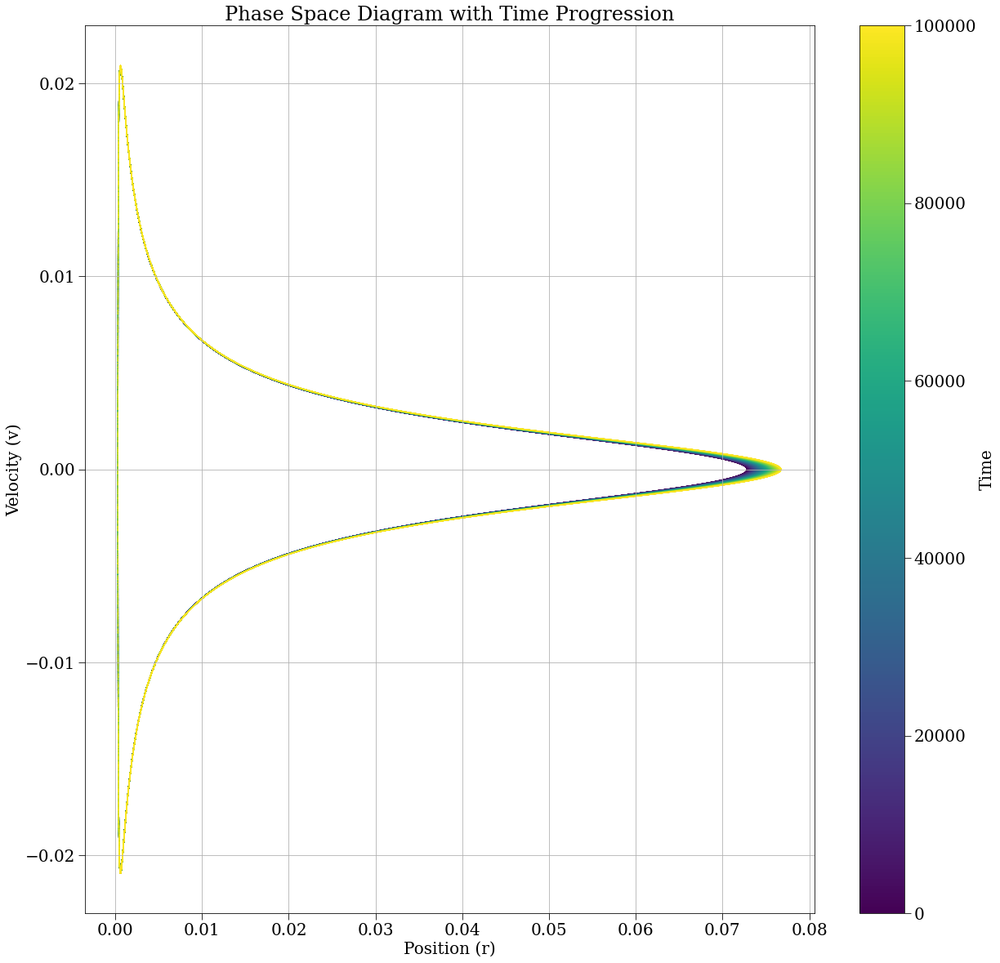

In [7]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
#plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


In [8]:
t_max = 100_000
config_gauss = make_cycloid_config(N=1, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1e-2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='beeman', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', )#timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-29 04:15:11,701 - collapse - INFO - Simulation setup complete


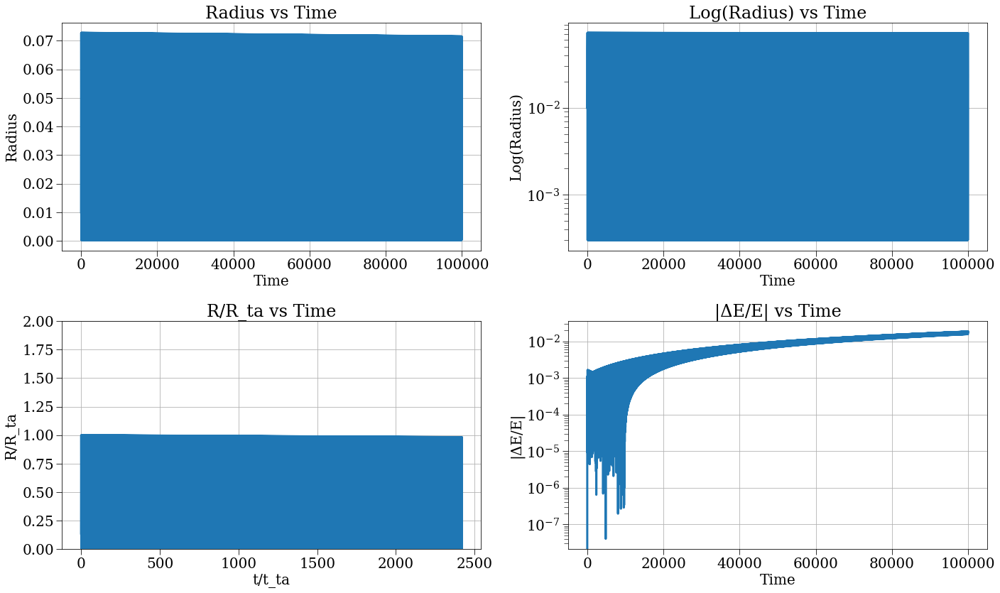

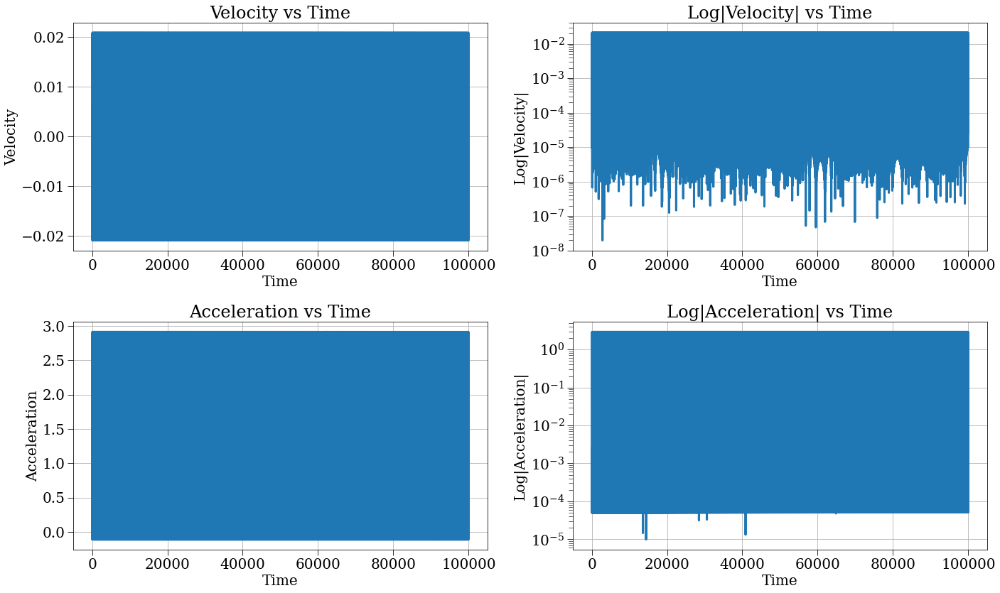

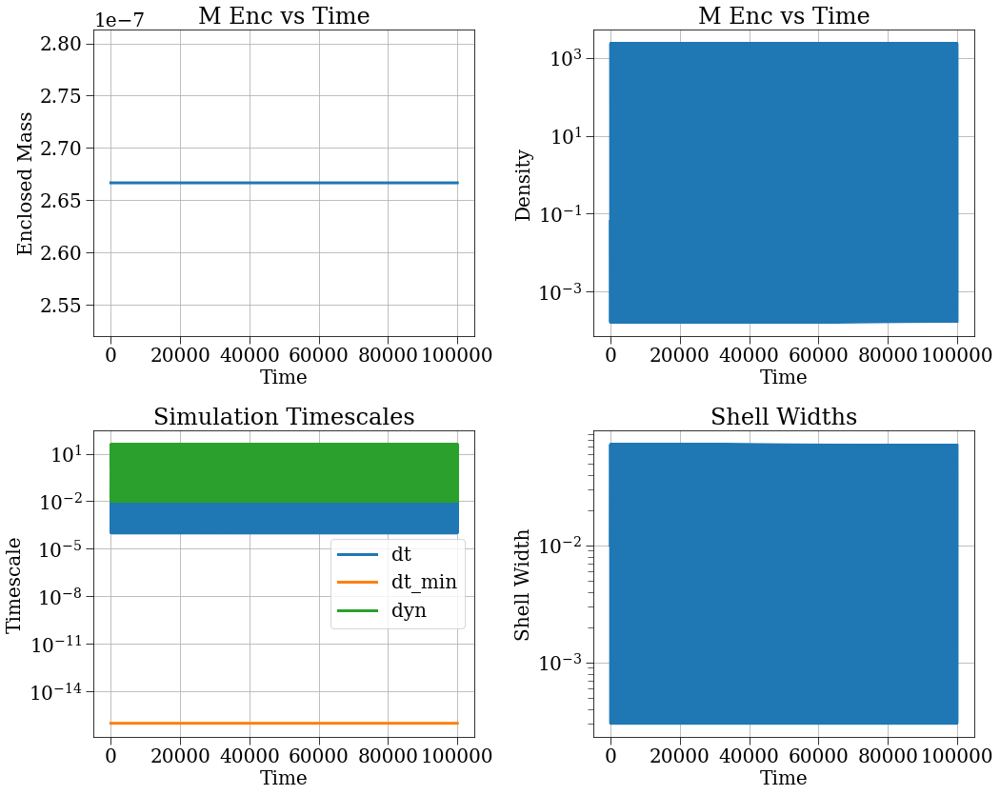

/home/jsipple/one_d_spherical_collapse/one-d-spherical-collapse-of-fuzzy-dark-matter/src/plotting.py:666: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/jsipple/.conda/envs/jsipple/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


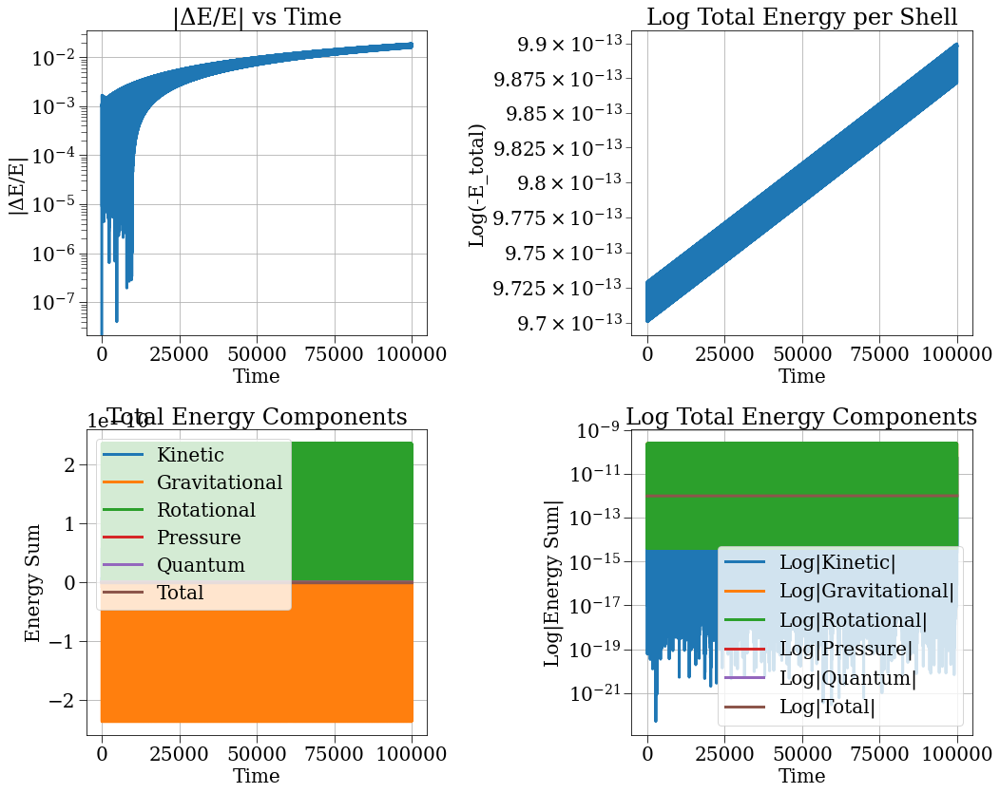

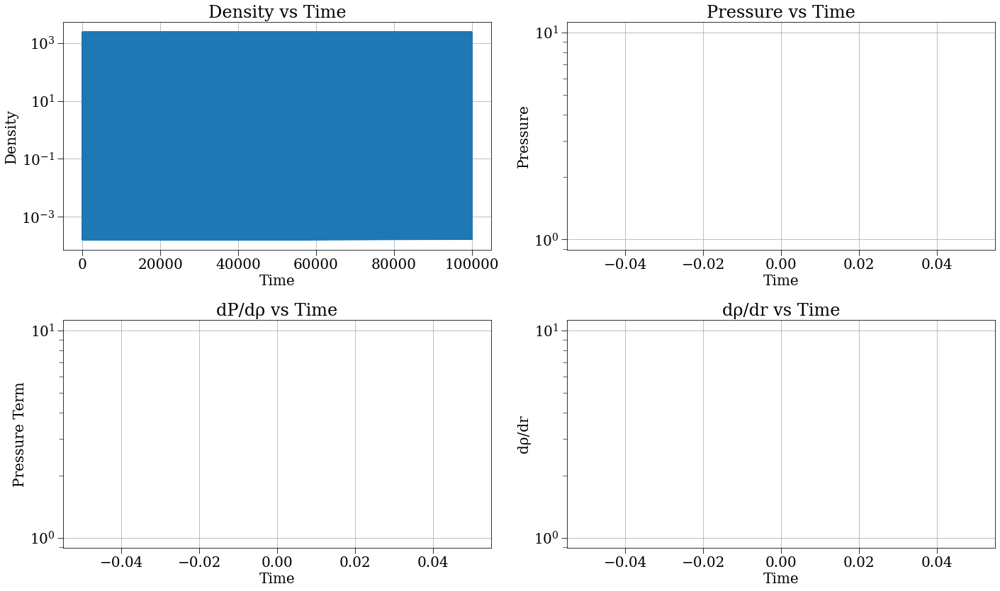

In [9]:
s, r, c = run_and_plot(config_gauss)

Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

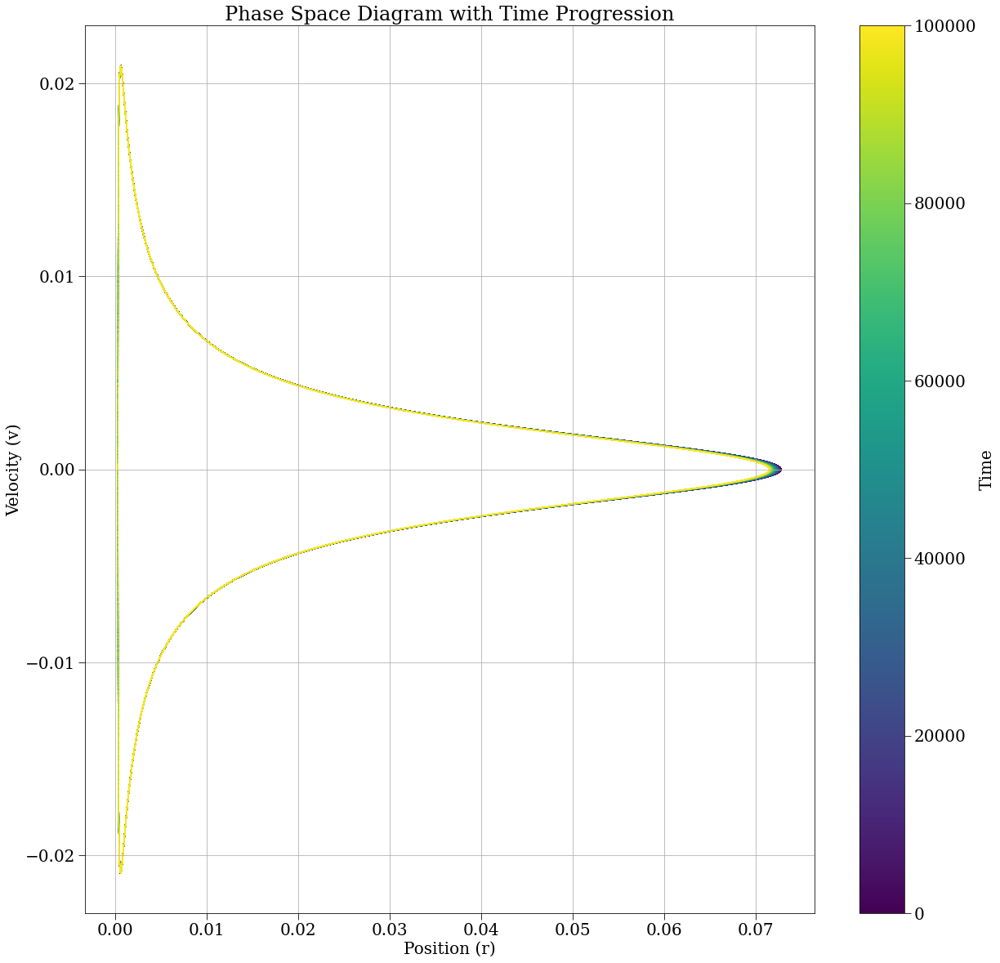

In [10]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
#plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


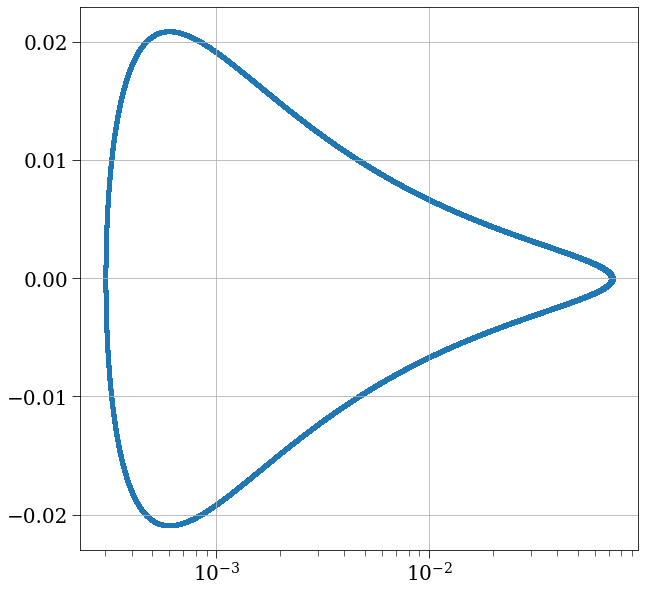

In [30]:
plt.figure(figsize=(10,10))
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
plt.scatter(rvals, vvals, s=10)
plt.xscale('log')

Text(0.5, 1.0, 'Phase Space Diagram with Time Progression')

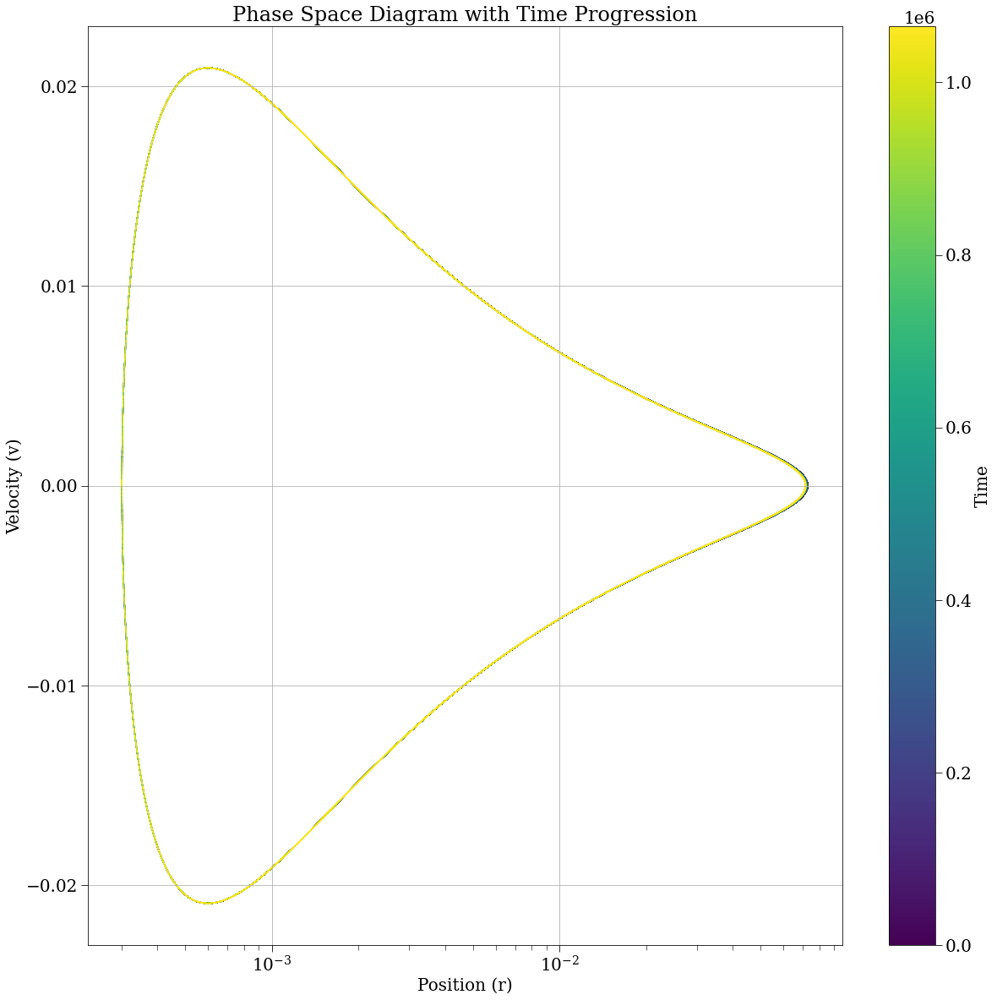

In [32]:
rvals = r['r'][:,0]
vvals = r['v'][:,0]
tvals = r['t']
# Assuming r and v are your position and velocity arrays
plt.figure(figsize=(20, 20))

# Create a colormap based on the time index
cmap = plt.get_cmap('viridis')

# Scatter plot with color representing time
skip = 1
sc = plt.scatter(rvals[::skip], vvals[::skip], c=tvals[::skip], cmap=cmap, s=0.1, label='Phase Space Points')

# Add a colorbar to show the time progression
cbar = plt.colorbar(sc)
cbar.set_label('Time')

# Set the x-axis to logarithmic scale
plt.xscale('log')

# Add labels and title
plt.xlabel('Position (r)')
plt.ylabel('Velocity (v)')
plt.title('Phase Space Diagram with Time Progression')


In [9]:
x = [1,2,3,4,5]
x[::1]

[1, 2, 3, 4, 5]

2025-05-28 01:12:05,085 - collapse - INFO - Simulation setup complete


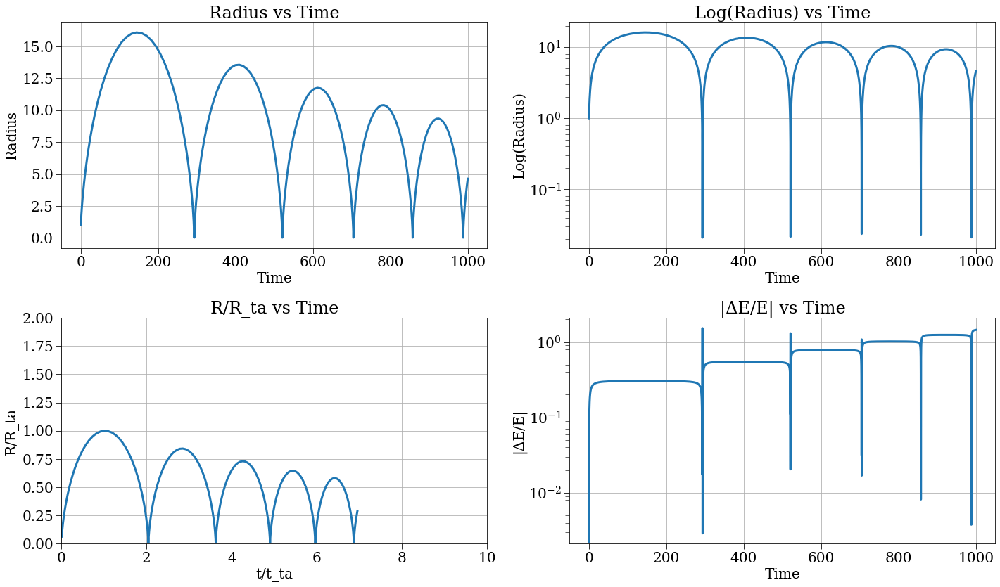

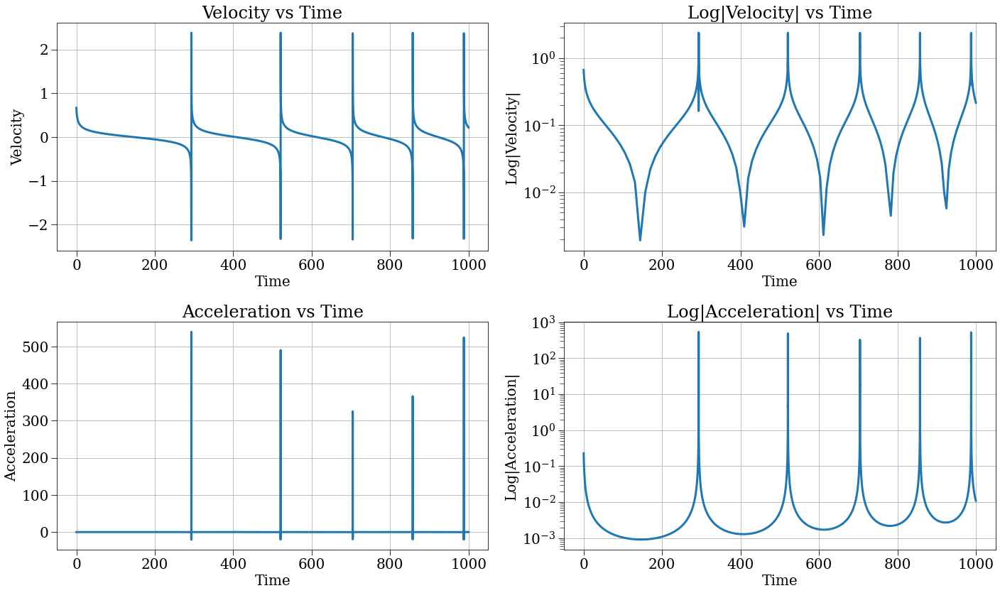

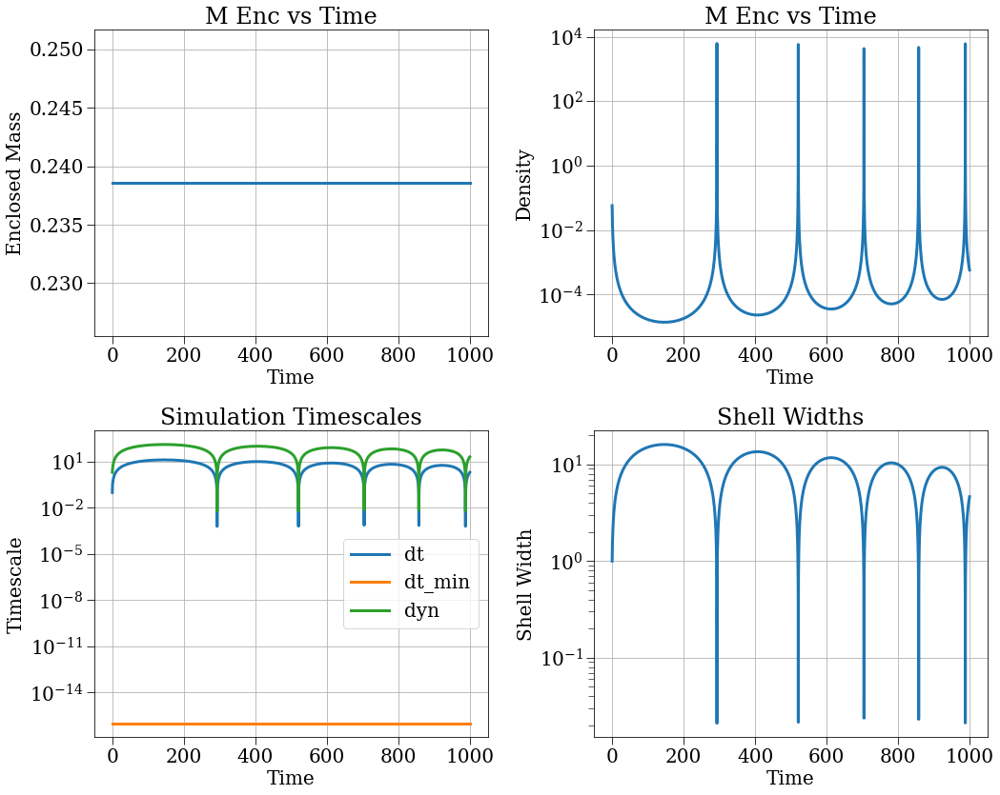

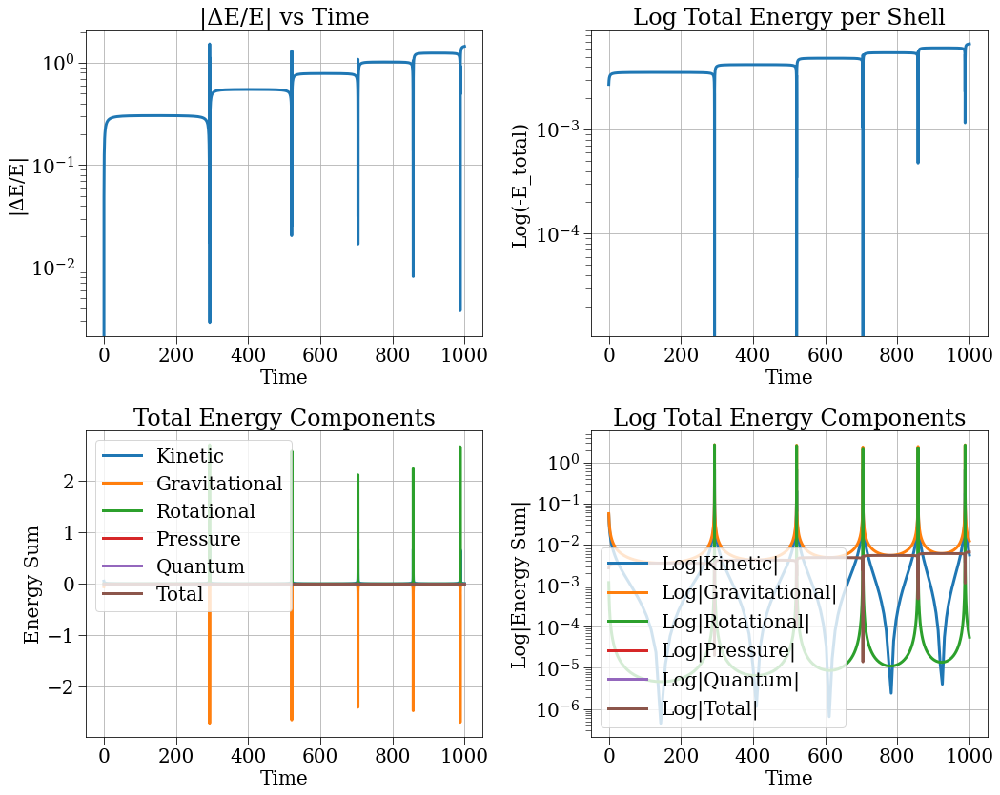

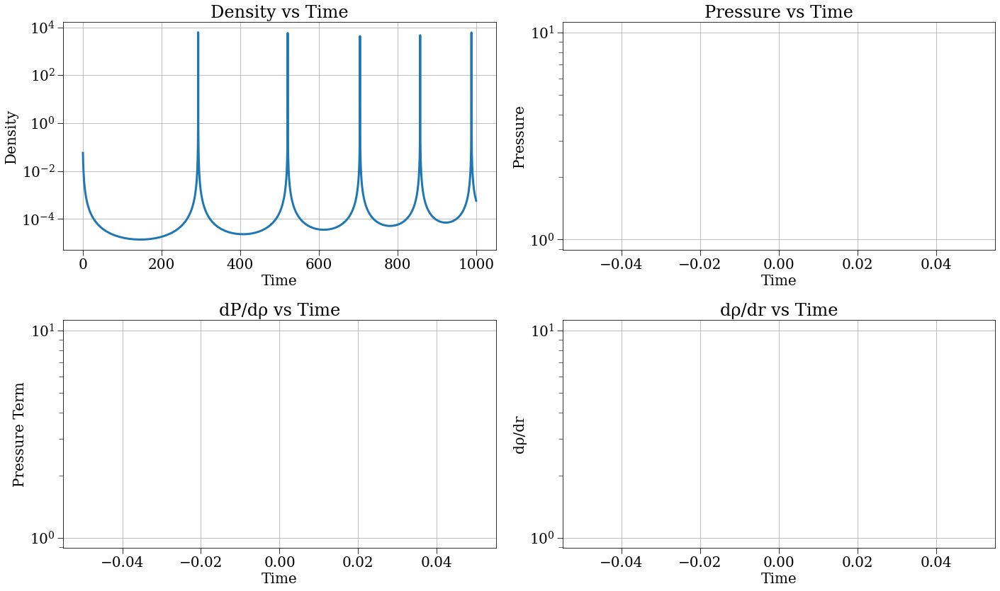

In [7]:
t_max = 2000
config_gauss = make_cycloid_config(N=100, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_vel', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-1, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-22 02:12:42,918 - collapse - INFO - Simulation setup complete


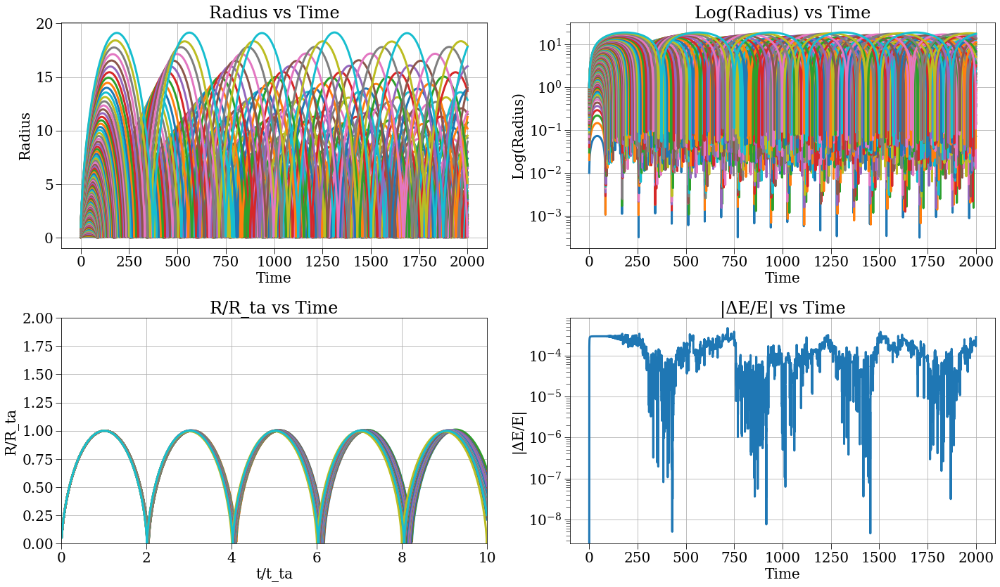

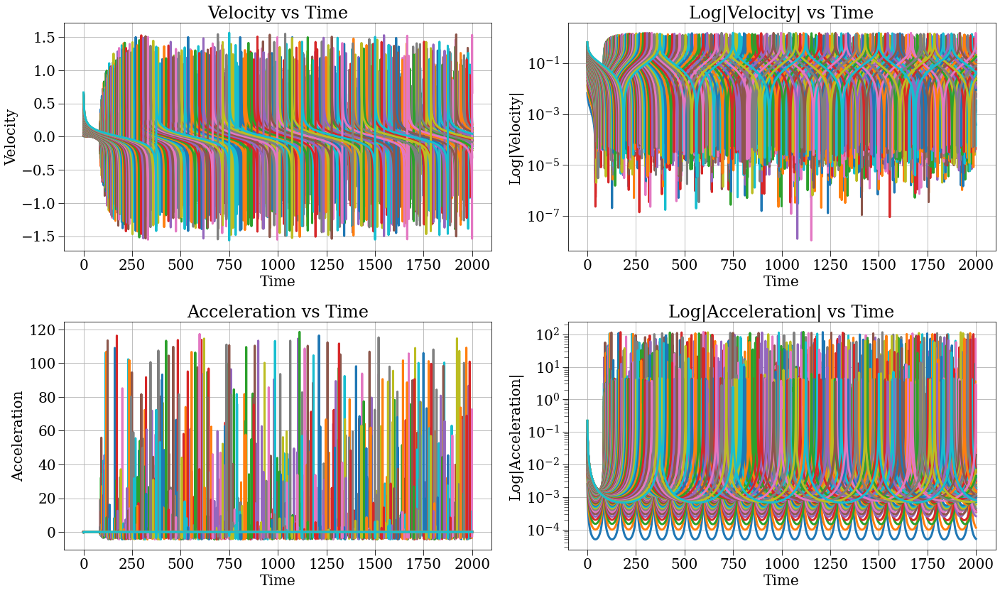

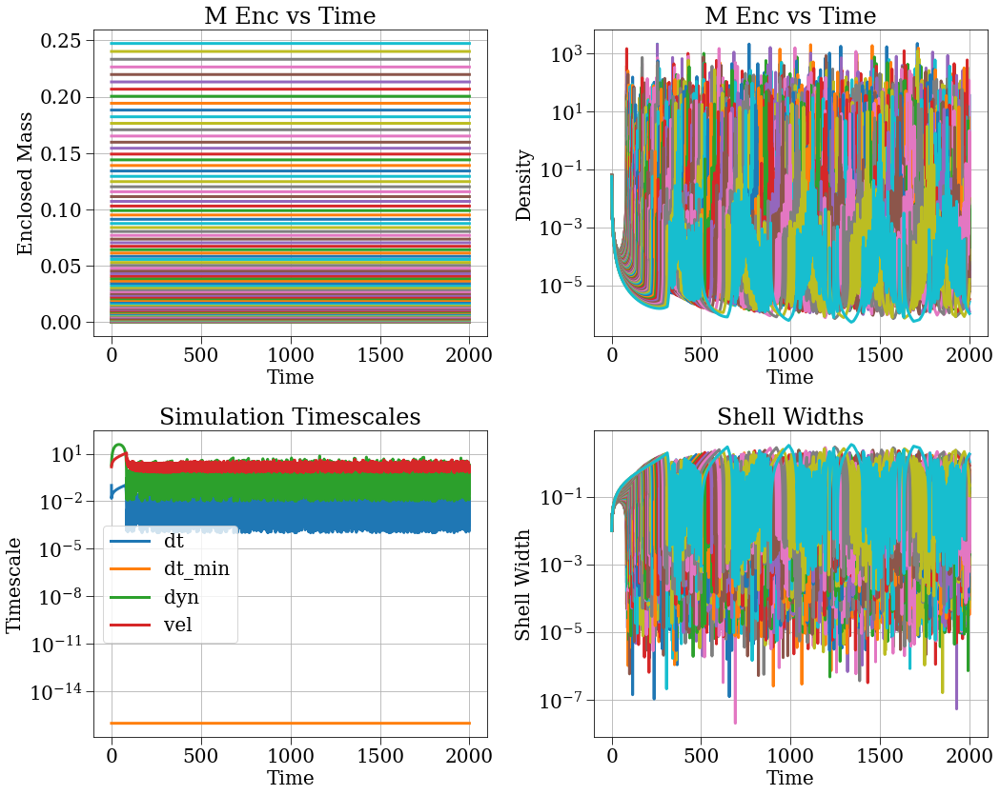

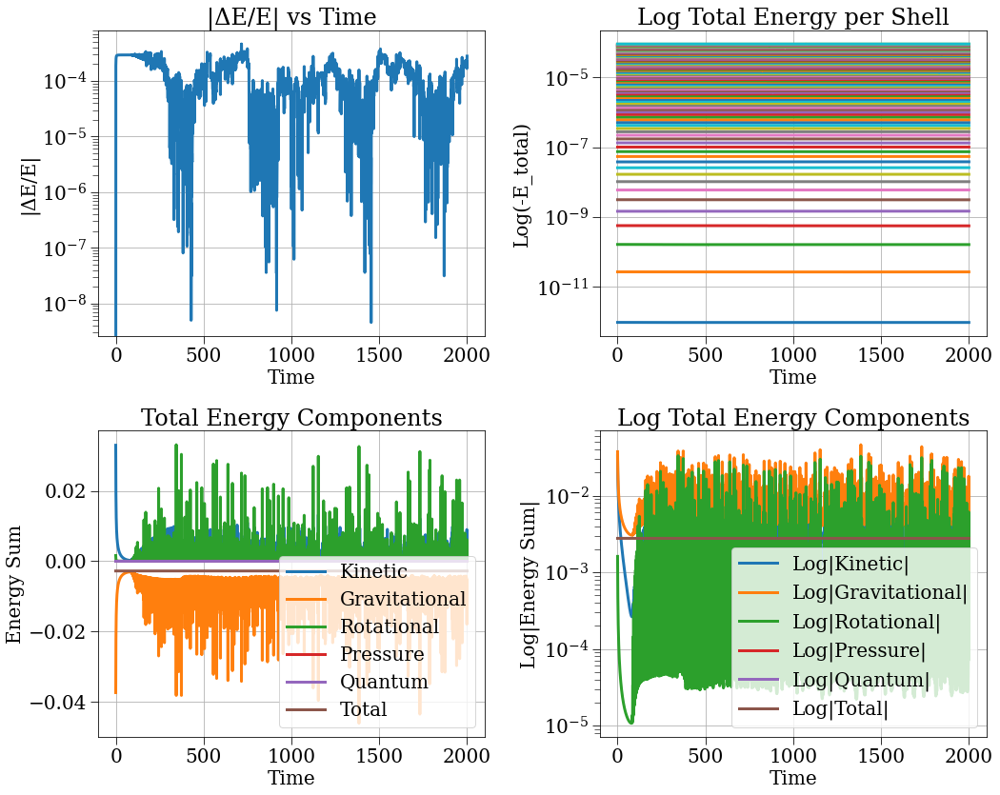

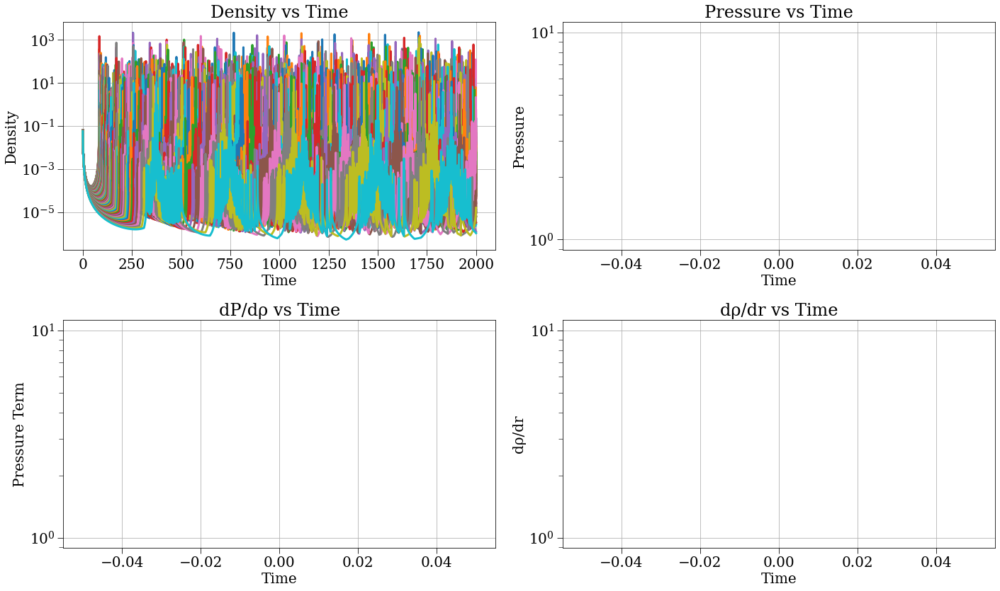

In [8]:
s, r, c = run_and_plot(config_gauss)

In [9]:
t_max = 2000
config_gauss = make_cycloid_config(N=100, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_vel', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=1, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-1, stepper_strategy='leapfrog_hut', j_coeff=1e-1, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive', timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-22 02:31:27,555 - collapse - INFO - Simulation setup complete


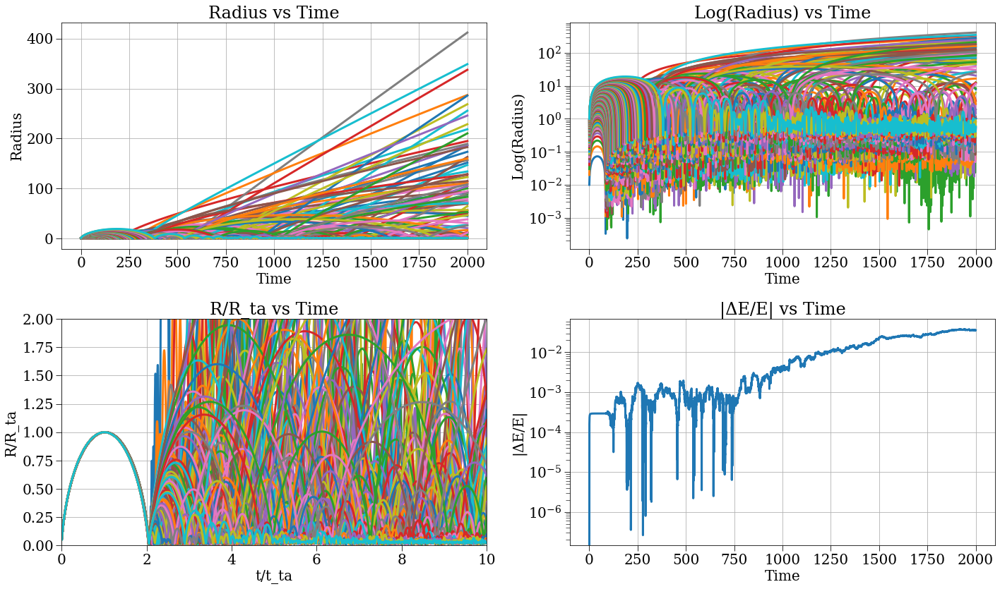

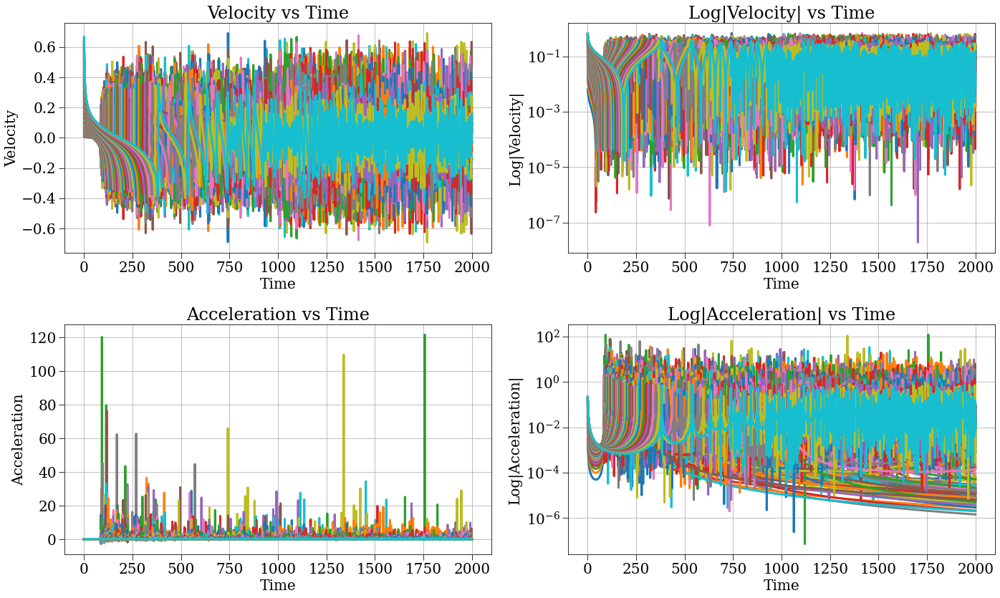

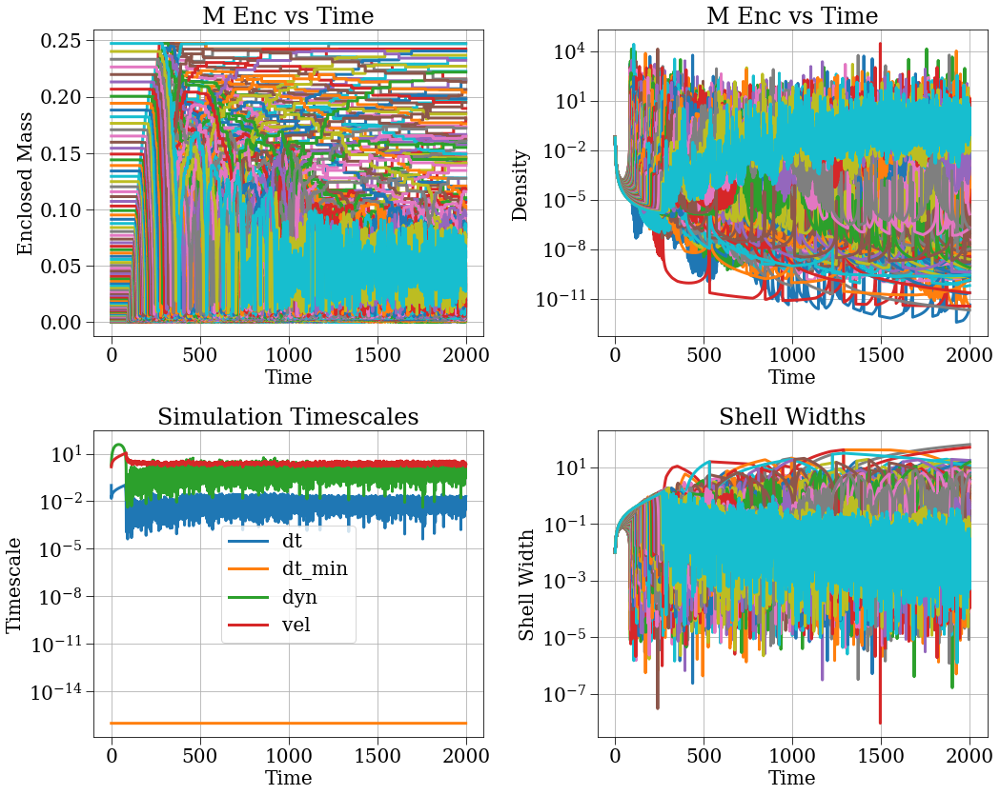

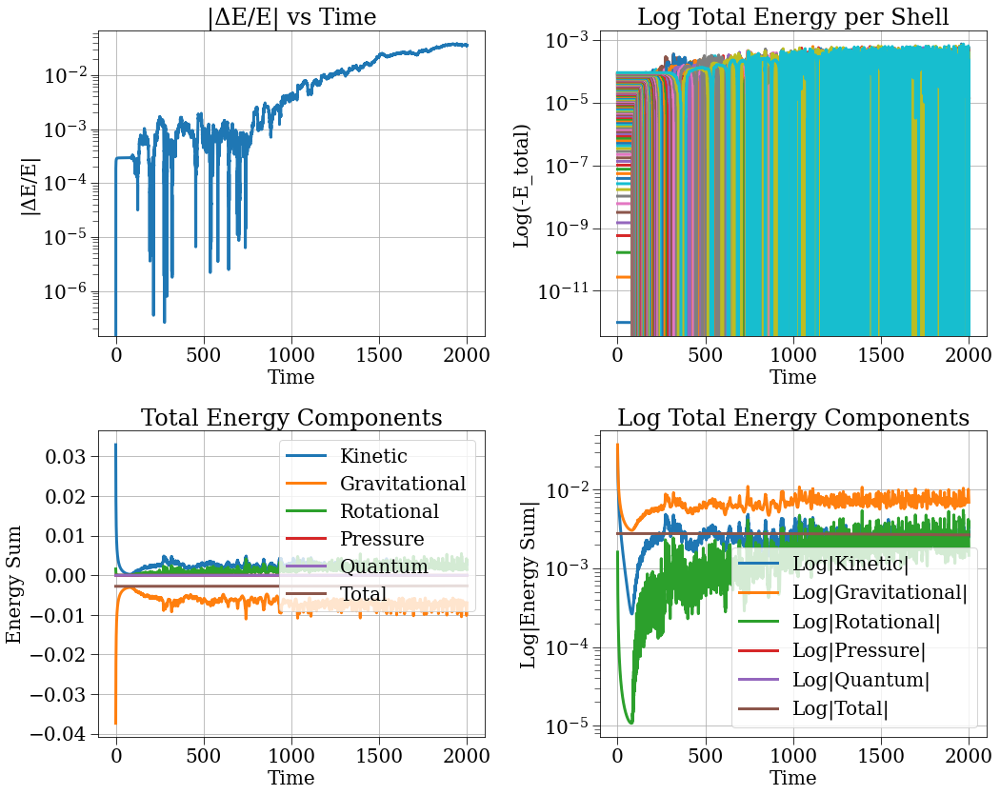

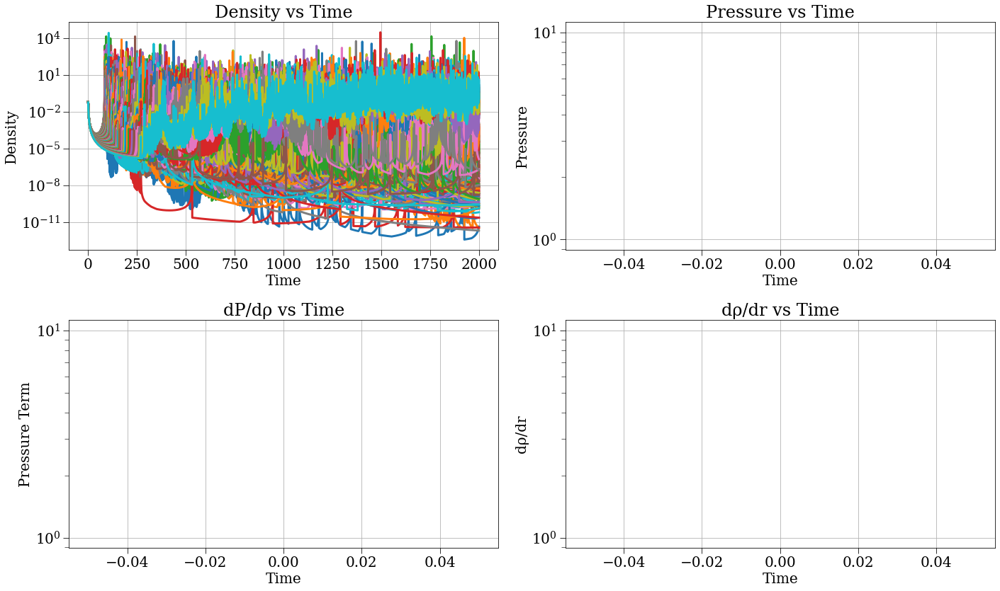

In [10]:
s, r, c = run_and_plot(config_gauss)

In [13]:
t_max = 1000
config_gauss = make_cycloid_config(N=10, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_vel', dt_min=1e-16, safety_factor=1e-4, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-2, stepper_strategy='adaptive_leapfrog', j_coeff=1e-2, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive', timestep_strategy='const_but_calculate', dt=1e-4)

2025-05-14 18:43:51,162 - collapse - INFO - Simulation setup complete


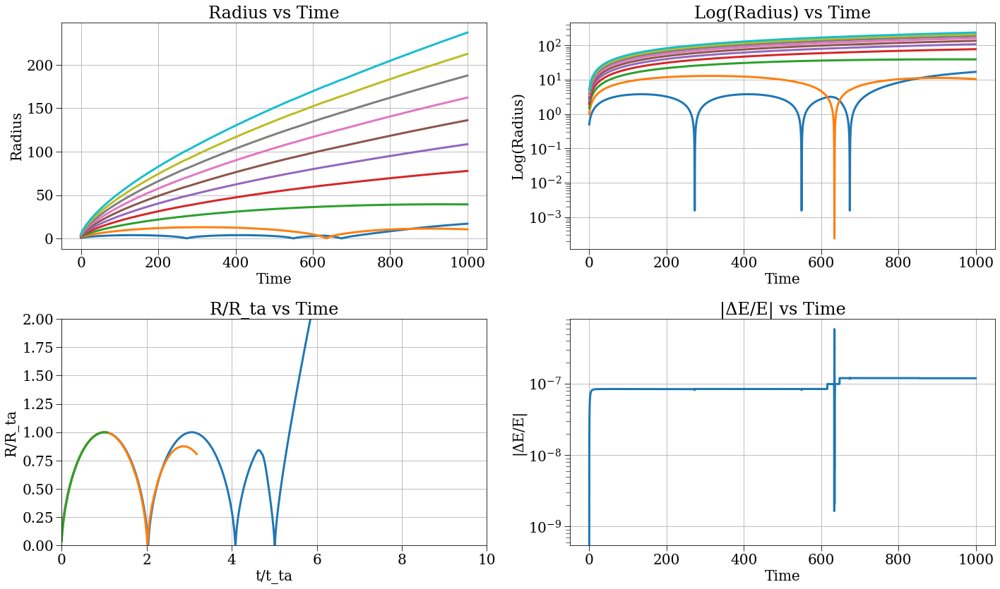

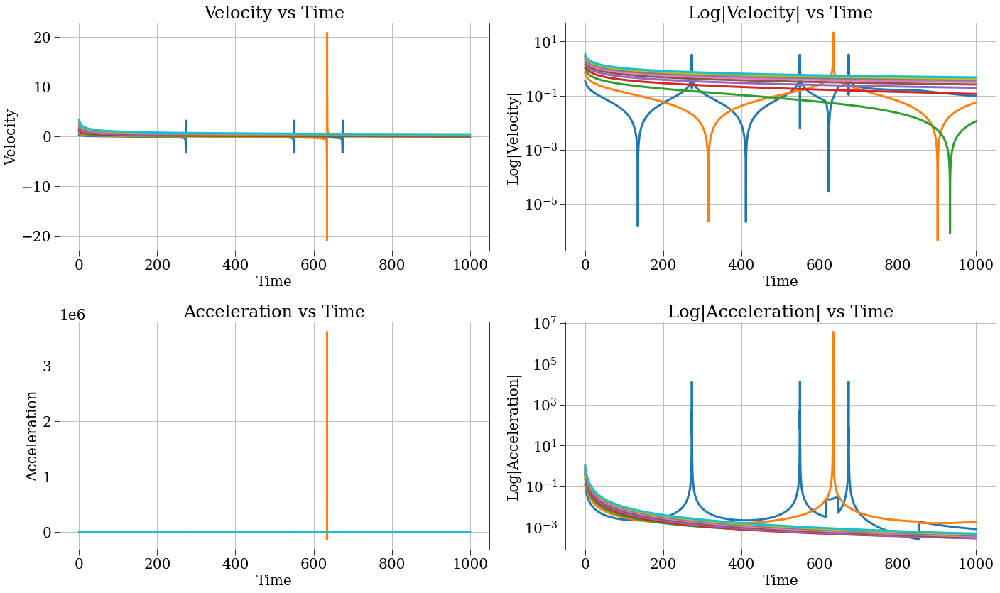

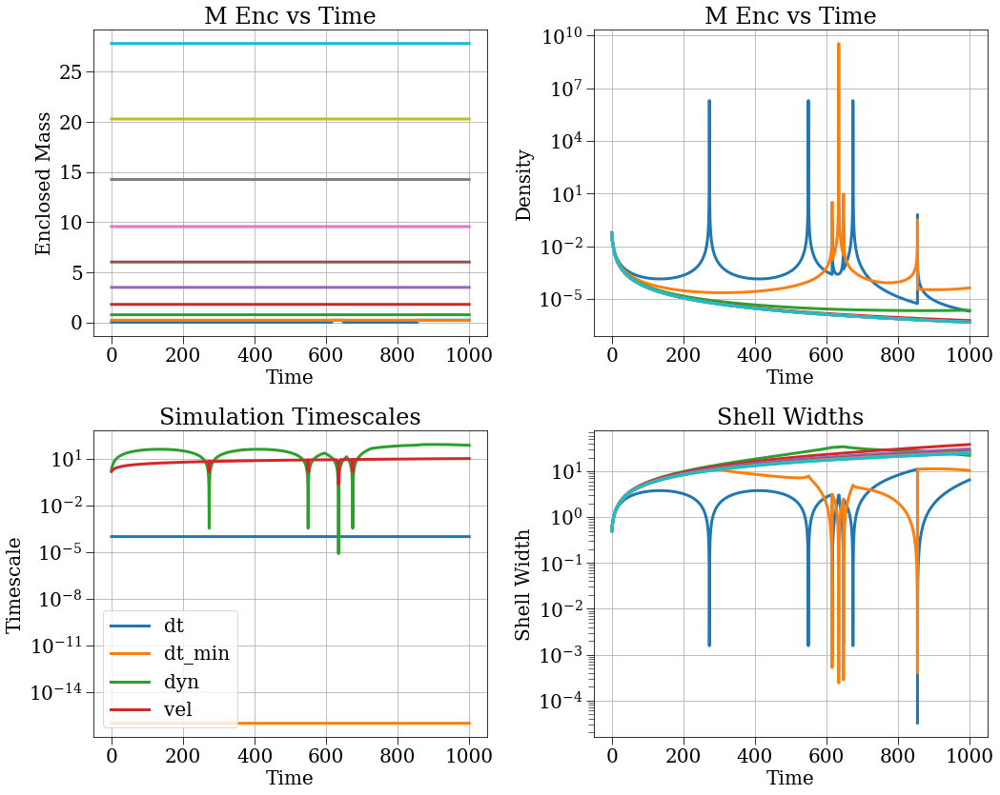

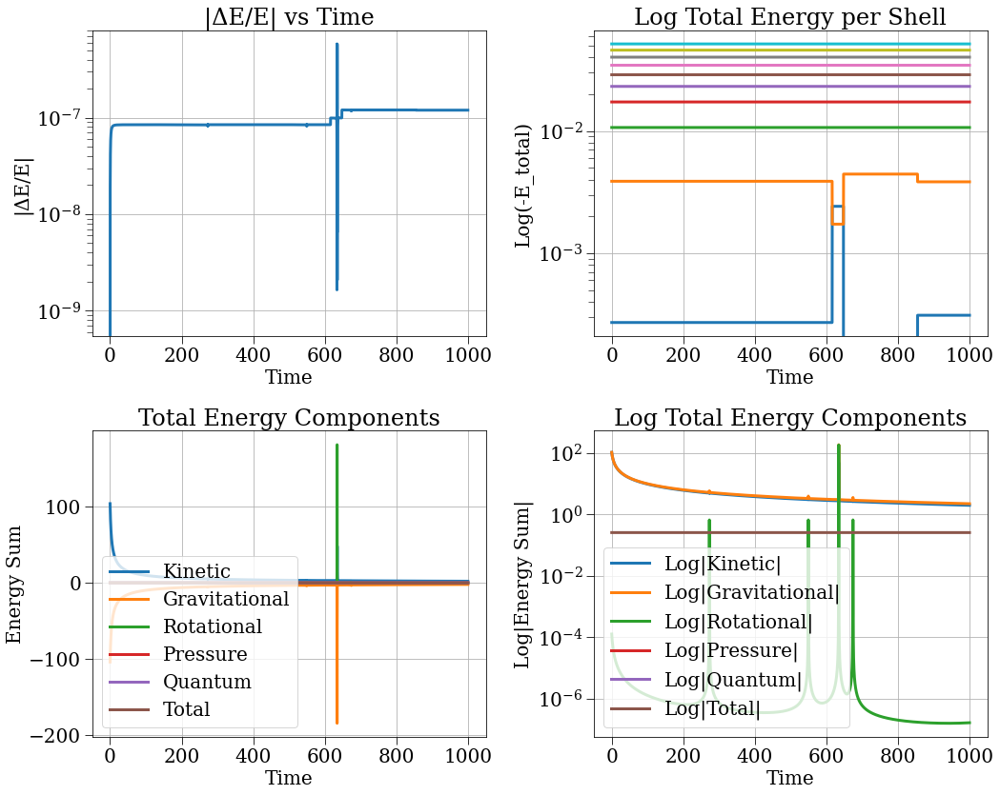

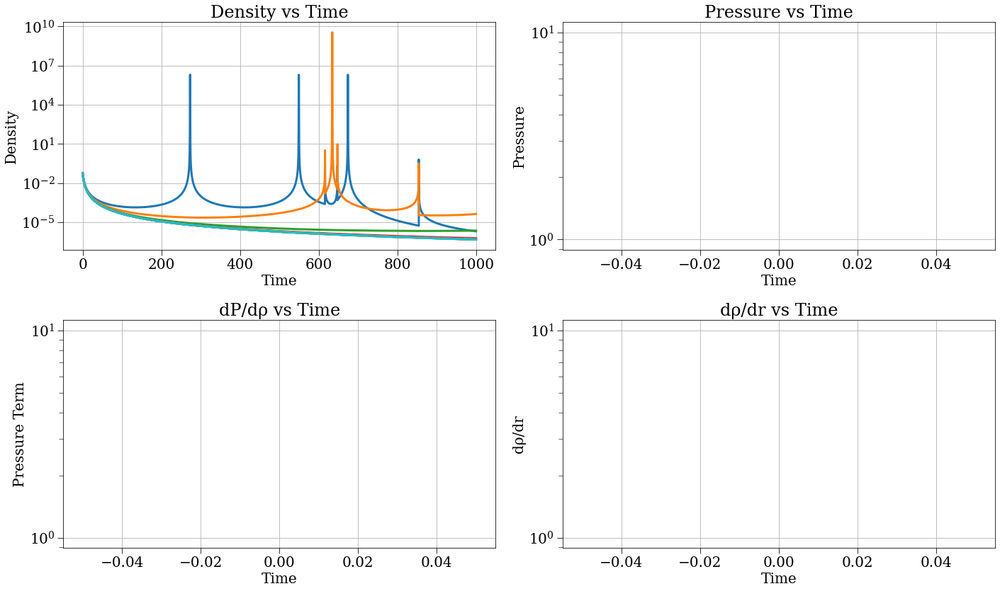

In [14]:
s, r, c = run_and_plot(config_gauss)

In [1]:
t_max = 5000
config_gauss = make_cycloid_config(N=10, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn_vel', dt_min=1e-16, safety_factor=1e-4, pressure_strategy='zero', no_pm=False, r_max=5, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='adaptive_leapfrog', j_coeff=1e-3, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='const_inclusive', timestep_strategy='const_but_calculate', dt=1e-5)

NameError: name 'make_cycloid_config' is not defined

2025-05-14 13:29:08,087 - collapse - INFO - Simulation setup complete


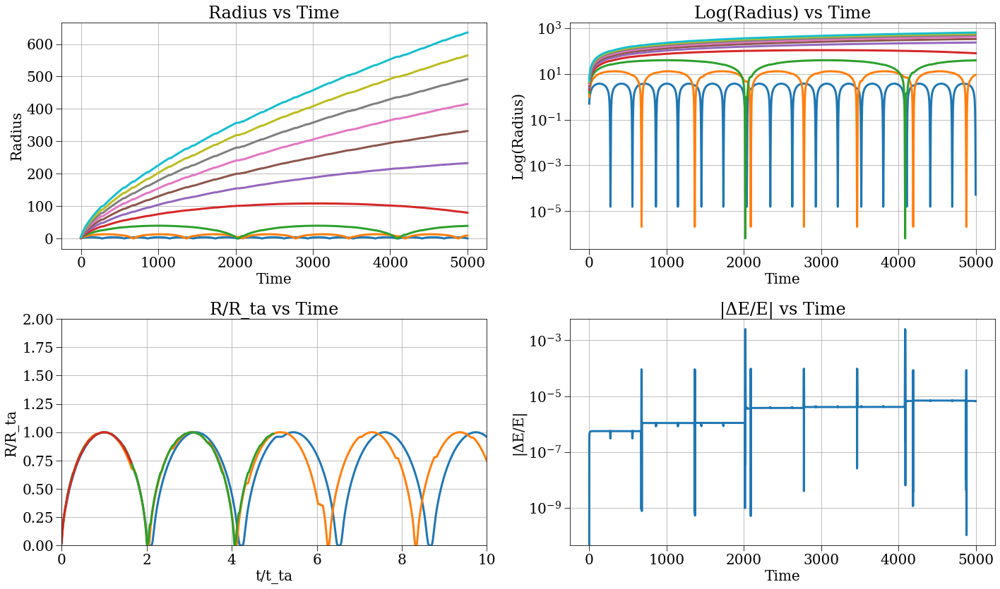

: 

: 

: 

In [9]:
s, r, c = run_and_plot(config_gauss)

-5.682761020063242e+42
300.0
The solver successfully reached the end of the integration interval.


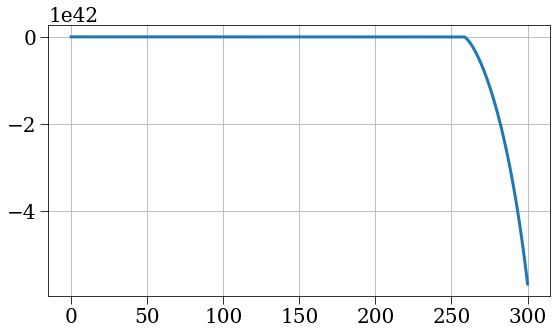

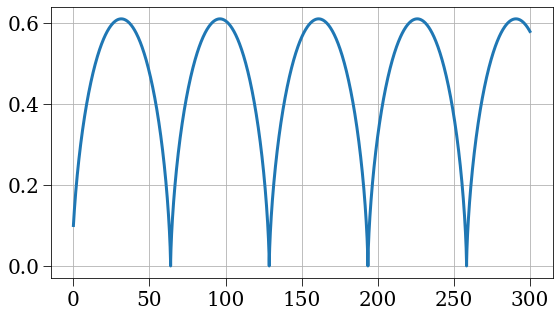

In [127]:
from scipy.integrate import quad, solve_ivp

def delta_r_tophat(R, delta=0.2):
    return delta

def delta_r_gaussian(R, delta=0.2, R_scale=1):
    return delta * np.exp(-R**2/R_scale**2)

def A_R0(R0, delta_r):
    def integrand(R):
        return R**2 * delta_r(R)
    res, err = quad(integrand, 0, R0, epsabs=1e-10, epsrel=1e-10)
    return 2/9 * (1 + 3/R0**3 * res)

R0 = 0.1
A_th = A_R0(R0=R0, delta_r=delta_r_tophat)
A_gauss = A_R0(R0=R0, delta_r=delta_r_gaussian)
def f(t, y, A):
    r, v, J, K = y
    drdt = v
    dvdt = -A/r**2 + 1e-3/r**3 
    dJdt = K
    dKdt = 2*A/r**3 * (J - 1.5*r)
    return np.array([drdt, dvdt, dJdt, dKdt])

t_end = 300
t_eval = np.linspace(0, t_end, int(1e7))
y0 = np.array([1, 2/3, 1, 2/3])
sol = solve_ivp(f, [0, t_end], y0, args=(A_gauss,), method='BDF', atol=1e-10, rtol=1e-10)
print(sol.y[2][-1])
print(sol.t[-1])
print(sol.message)
plt.plot(sol.t, sol.y[2])
plt.figure()
plt.plot(sol.t, R0*sol.y[0])

The best R0 is 0.01 which produces the earliest root for J at time 62.58512585125851
The best R0 is 0.01 which produces the earliest root for J at time 62.58512585125851


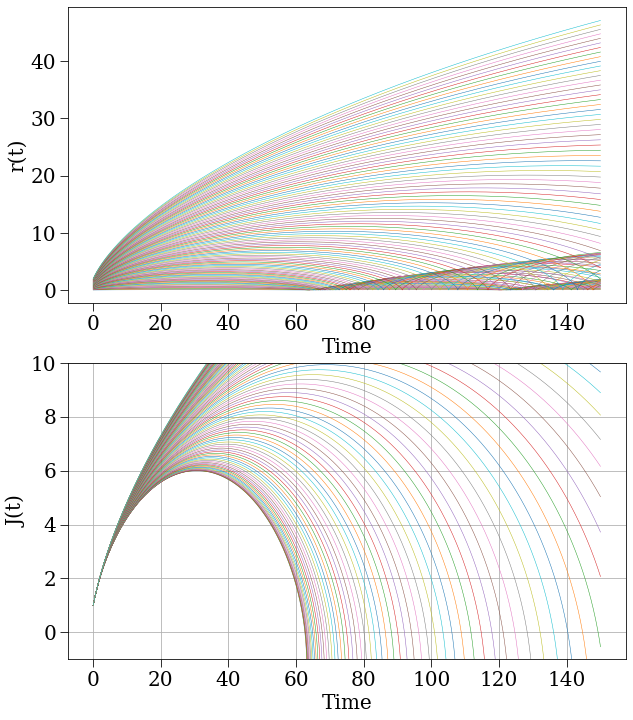

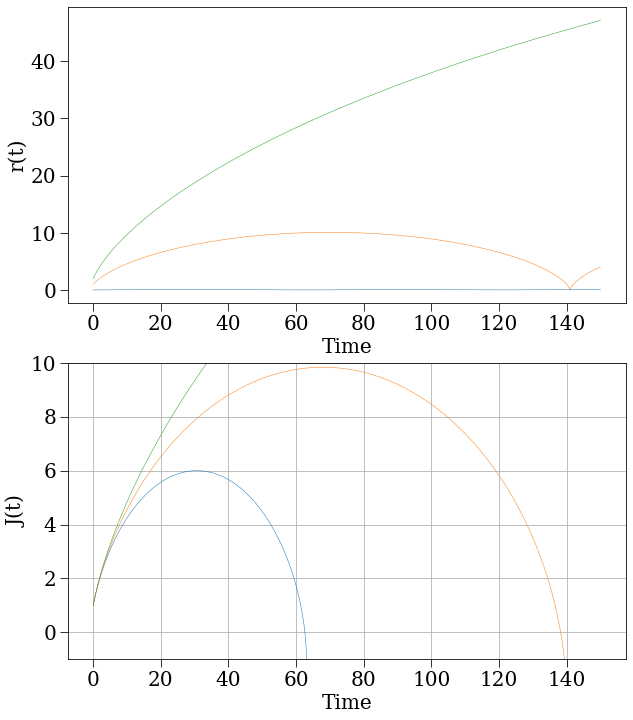

In [137]:
def find_earliest_root_for_J(R0_values, delta_r_func, t_end=100):
    earliest_time = float('inf')
    best_R0 = None
    t_eval = np.linspace(0, t_end, int(1e5))
    y0 = np.array([1, 2/3, 1, 2/3])

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))
    
    for R0 in R0_values:
        A = A_R0(R0, delta_r_func)
        sol = solve_ivp(f, [0, t_end], y0, args=(A,), t_eval=t_eval, method='BDF', rtol=1e-5, atol=1e-9)
        
        # Plot r(t) for each R0
        ax1.plot(sol.t, R0*sol.y[0], label=f'R0 = {R0:.2f}', lw=0.5)
        ax2.plot(sol.t, sol.y[2], label=f'R0 = {R0:.2f}', lw=0.5)
        
        # Print the solver's message
        if not sol.success:
            print(f"R0: {R0}, Solver message: {sol.message}")
        
        # Find the first time J crosses zero
        J_values = sol.y[2]
        zero_crossings = np.where(np.diff(np.sign(J_values)))[0]
        
        if zero_crossings.size > 0:
            first_zero_time = sol.t[zero_crossings[0]]
            if first_zero_time < earliest_time:
                earliest_time = first_zero_time
                best_R0 = R0

    ax1.set_xlabel('Time')
    ax1.set_ylabel('r(t)')
    ax1.grid(False)
    ax2.set_xlabel('Time')
    ax2.set_ylabel('J(t)')
    ax2.set_ylim(-1,10)
    ax2.grid(True)

    return best_R0, earliest_time

# Define a range of R0 values to test
R0_values = np.linspace(0.01, 2, 100)
best_R0, earliest_time = find_earliest_root_for_J(R0_values, delta_r_gaussian, t_end=150)
print(f"The best R0 is {best_R0} which produces the earliest root for J at time {earliest_time}")

R0_values = np.linspace(0.01, 2, 3)
best_R0, earliest_time = find_earliest_root_for_J(R0_values, delta_r_gaussian, t_end=150)
print(f"The best R0 is {best_R0} which produces the earliest root for J at time {earliest_time}")

In [124]:
t_max = 150
N = 20
config_gauss = make_cycloid_config(N=N, reflect_bool=False, t_max=t_max, r_min=0, timescale_strategy='dyn', dt_min=1e-16, safety_factor=1e-2, pressure_strategy='zero', no_pm=False, r_max=2, accel_strategy='soft_all', delta_i=0.2, r_th=1, energy_strategy='kin_grav_rot', H=H0, save_dt=1e-3, stepper_strategy='leapfrog_kdk', j_coeff=1e-2, density_strategy='background_plus_gaussian', irs='dr_start_equal', mes='overlap_inclusive',)#timestep_strategy='const_but_calculate', dt=1e-1)

2025-05-29 01:38:43,929 - collapse - INFO - Simulation setup complete


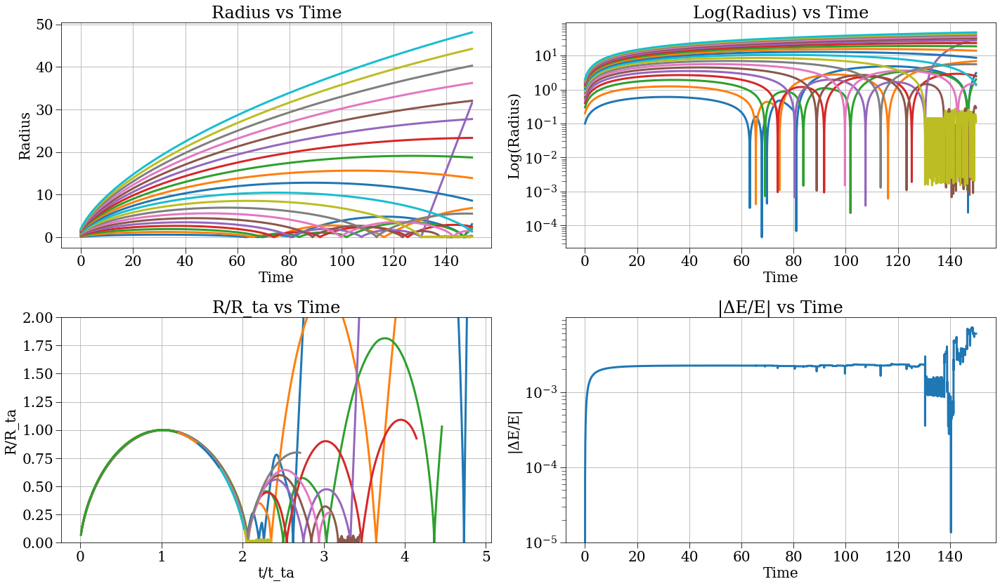

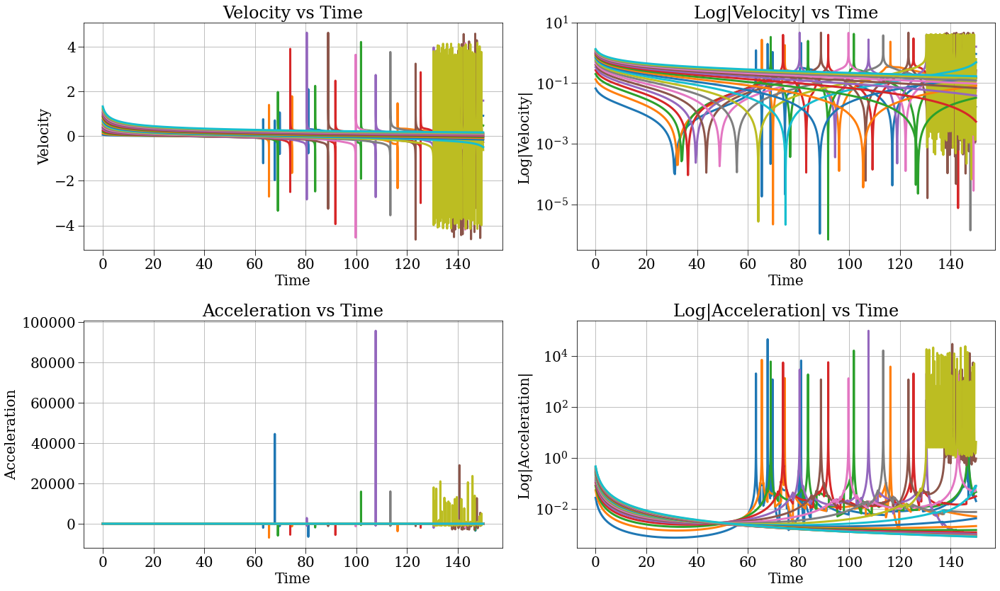

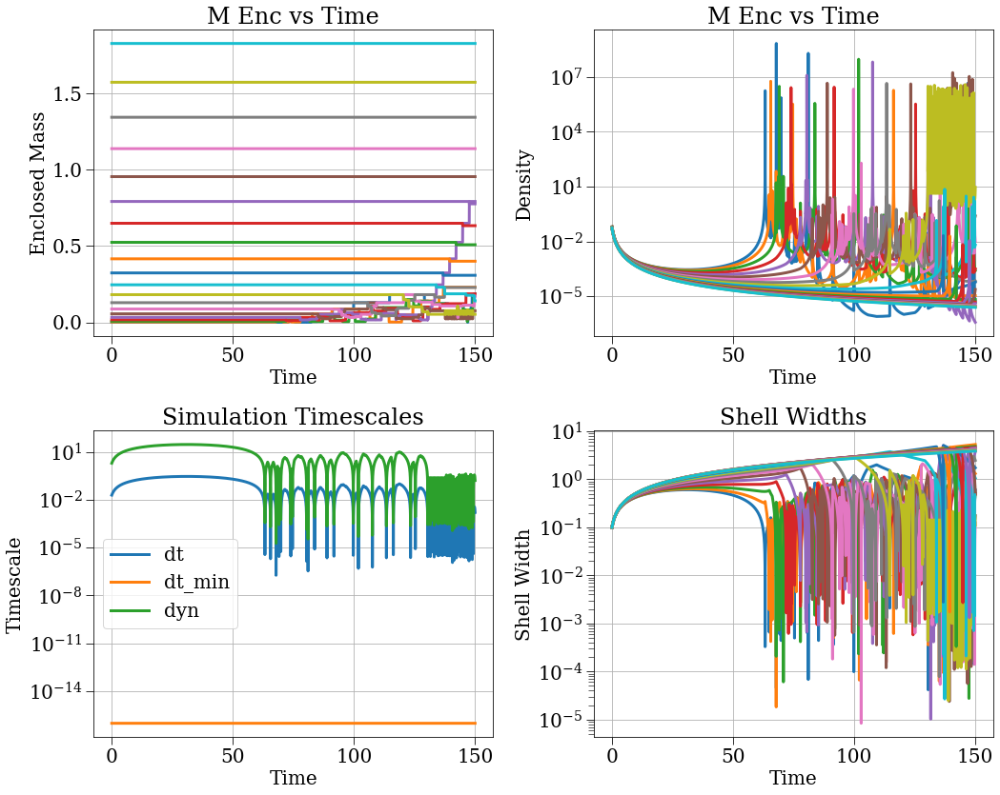

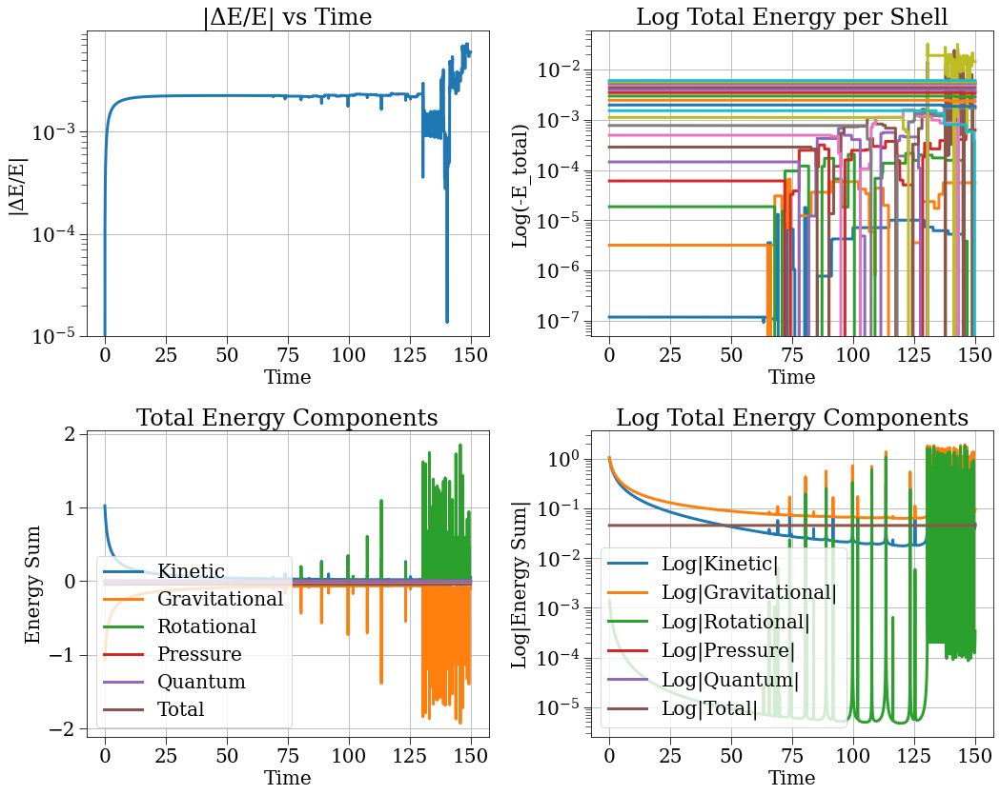

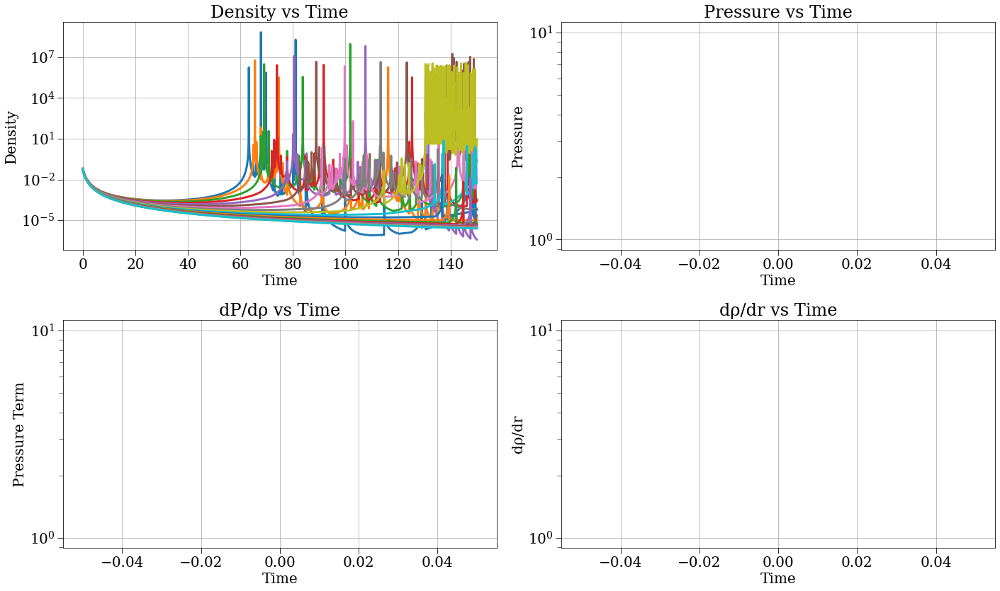

In [125]:
s, r, c = run_and_plot(config_gauss)